# Air Quality Prediction Experiment

# Load data

In [1]:
EXPERIMENT_NAME = "January 2022 to December 2024"
EXPERIMENT_DESCRIPTION = "January 2025 fire period with PWWB, Airnow, and HRRR data."

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# load train test and valid files
print("Loading testing, training, and validation files...")

pwwb_only_test_files = [
    "MAIAC_AOD_X_jan_test.npy", 
    "TROPOMI_NO2_X_jan_test.npy", 
    "METAR_Wind_U_X_jan_test.npy", 
    "METAR_Wind_V_X_jan_test.npy", 
    "AirNow_PM25_X_jan_test.npy", 
]

all_test_files = [
    "MAIAC_AOD_X_jan_test.npy", 
    "TROPOMI_NO2_X_jan_test.npy", 
    "METAR_Wind_U_X_jan_test.npy", 
    "METAR_Wind_V_X_jan_test.npy", 
    "AirNow_PM25_X_jan_test.npy", 
    "HRRR_COLMD_X_jan_test.npy"
]

print("Loading numpy arrays...")
hrrr_X_test = np.stack([np.load(f"final_input_data/jan_2025_with_hrrr/{file}") for file in all_test_files], axis=-1)
pwwb_X_test = np.stack([np.load(f"final_input_data/jan_2025_with_hrrr/{file}") for file in pwwb_only_test_files], axis=-1)

Y_jan_test = np.load("final_input_data/jan_2025_with_hrrr/Y_jan_test.npy")
print("Data successfully loaded.")

Loading testing, training, and validation files...
Loading numpy arrays...
Data successfully loaded.


In [3]:
# Debug cell to check channel names and data shapes
print("=== DEBUGGING CHANNEL INFORMATION ===")
all_channel_names = ['MAIAC_AOD', 'TROPOMI_NO2', 'METAR_Wind_U', 'METAR_Wind_V', 'AirNow_PM25', 'HRRR_COLMD']
print(f"Experiment name: {EXPERIMENT_NAME}")
print(f"X_train_scaled shape: {hrrr_X_test.shape}")
print(f"Number of channels in data: {hrrr_X_test.shape[4]}")
print(f"Number of channel names provided: {len(all_channel_names)}")
print(f"Channel names length matches data channels: {len(all_channel_names) == hrrr_X_test.shape[4]}")
print()

print("Channel names provided:")
for i, name in enumerate(all_channel_names):
    print(f"  {i}: {name}")
print()

print("What the visualization function will use:")
n_channels = hrrr_X_test.shape[4]
if all_channel_names is None or len(all_channel_names) != n_channels:
    effective_channel_names = [f"Channel {i}" for i in range(n_channels)]
    print("  Using GENERIC channel names (this is the problem!):")
else:
    effective_channel_names = all_channel_names
    print("  Using PROVIDED channel names:")

for i, name in enumerate(effective_channel_names):
    print(f"  {i}: {name}")
print()

print("=== DATA SAMPLE CHECK ===")
# Check what's actually in the first few channels
sample_idx = 42  # Use same sample as visualization
for c in range(min(3, n_channels)):  # Check first 3 channels
    data = hrrr_X_test[sample_idx, 0, :, :, c]  # First frame
    print(f"Channel {c} ({effective_channel_names[c] if c < len(effective_channel_names) else 'Unknown'}):")
    print(f"  Min: {data.min():.6f}, Max: {data.max():.6f}, Mean: {data.mean():.6f}")
    print()

=== DEBUGGING CHANNEL INFORMATION ===
Experiment name: January 2022 to December 2024
X_train_scaled shape: (735, 5, 40, 40, 6)
Number of channels in data: 6
Number of channel names provided: 6
Channel names length matches data channels: True

Channel names provided:
  0: MAIAC_AOD
  1: TROPOMI_NO2
  2: METAR_Wind_U
  3: METAR_Wind_V
  4: AirNow_PM25
  5: HRRR_COLMD

What the visualization function will use:
  Using PROVIDED channel names:
  0: MAIAC_AOD
  1: TROPOMI_NO2
  2: METAR_Wind_U
  3: METAR_Wind_V
  4: AirNow_PM25
  5: HRRR_COLMD

=== DATA SAMPLE CHECK ===
Channel 0 (MAIAC_AOD):
  Min: -1.048153, Max: 1.806449, Mean: 0.207411

Channel 1 (TROPOMI_NO2):
  Min: -0.746047, Max: 6.225416, Mean: 0.899217

Channel 2 (METAR_Wind_U):
  Min: -0.777317, Max: -0.580504, Mean: -0.696996



Visualizing data for January 2022 to December 2024...


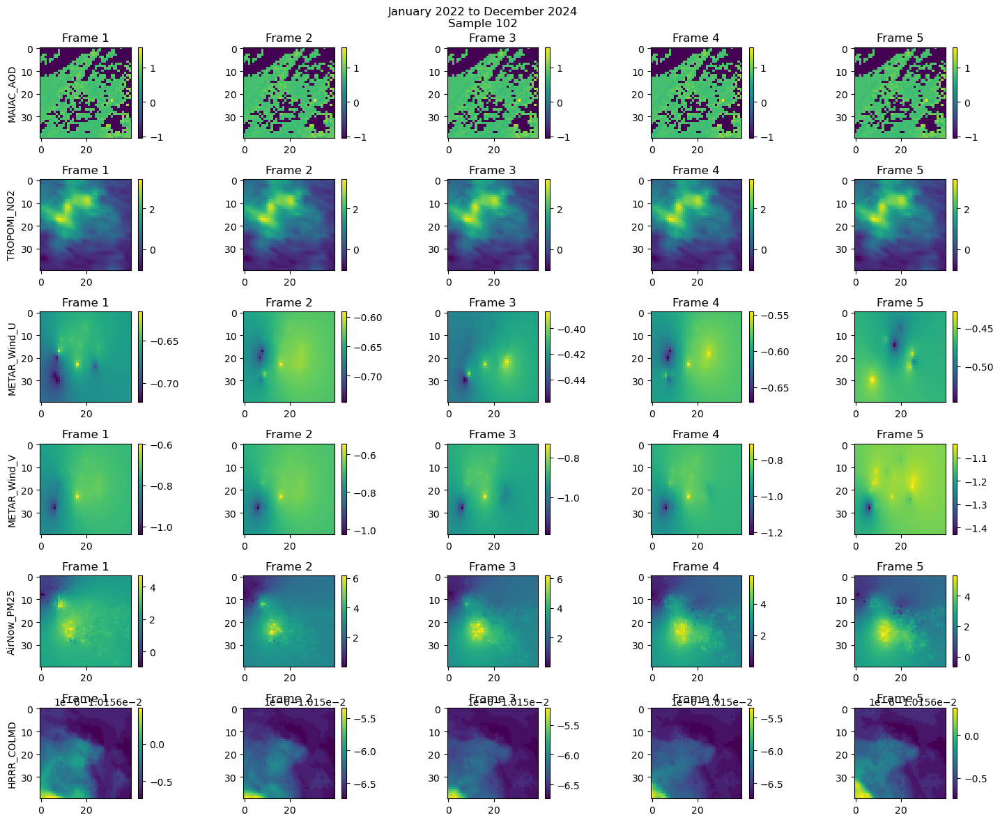

Target values: [[ 2.7  2.2  8.7 22.2 24.2 42.2 35.7  3. ]
 [ 2.3  0.8  7.3 16.8 20.  38.1 34.4  2.3]
 [ 4.6  1.2  7.8 13.6 16.2 34.8 33.1  2.4]
 [ 5.3  1.2  7.3 11.8 13.3 31.8 33.5  0.8]
 [ 4.6  1.8  5.8 11.1 11.4 29.4 39.8  0. ]]


In [4]:
# Function to visualize data from experiment
np.random.seed(42)
def visualize_experiment_data(X, Y, channel_names=None, sample_idx=None, experiment_name="Experiment"):
    """Visualize data from the experiment"""
    # Get a random sample if none provided
    if sample_idx is None:
        sample_idx = np.random.choice(range(len(X)), size=1)[0]
    
    # Get channel information
    n_channels = X.shape[4]
    n_frames = X.shape[1]
    
    # Use provided channel names or create default ones
    if channel_names is None or len(channel_names) != n_channels:
        channel_names = [f"Channel {i}" for i in range(n_channels)]
    
    # Create figure
    fig, axes = plt.subplots(n_channels, n_frames, figsize=(3*n_frames, 2*n_channels))
    if n_channels == 1:
        axes = axes.reshape(1, -1)
    
    # Plot each channel and frame
    for c in range(n_channels):
        channel_name = channel_names[c] if c < len(channel_names) else f"Channel {c}"
        
        for f in range(n_frames):
            ax = axes[c, f]
            data = X[sample_idx, f, :, :, c]
            
            im = ax.imshow(data)
            
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            if f == 0:
                ax.set_ylabel(channel_name)
            ax.set_title(f"Frame {f+1}")
    
    # Set title
    plt.suptitle(f"{experiment_name}\nSample {sample_idx}")
    plt.tight_layout()
    plt.show()
    
    # Print target values
    if Y is not None:
        print(f"Target values: {Y[sample_idx]}")

# Run the visualization  
print(f"Visualizing data for {EXPERIMENT_NAME}...")
visualize_experiment_data(hrrr_X_test, Y_jan_test, channel_names=all_channel_names, experiment_name=EXPERIMENT_NAME)

# Model Definition

In [5]:
_, n_frames, output_size = Y_jan_test.shape # (frames, stations)
input_shape = hrrr_X_test.shape[1:] # (frames, height, width, channels)

print(
    f"hrrr_X_test shape:    {hrrr_X_test.shape}\n"
    f"pwwb_X_test shape:    {pwwb_X_test.shape}\n"
    f"Y_jan_test shape:     {Y_jan_test.shape}\n\n"

    f"Input shape:          {input_shape}\n"
    f"Output shape:         ({n_frames}, {output_size})\n"
)

hrrr_X_test shape:    (735, 5, 40, 40, 6)
pwwb_X_test shape:    (735, 5, 40, 40, 5)
Y_jan_test shape:     (735, 5, 8)

Input shape:          (5, 40, 40, 6)
Output shape:         (5, 8)



In [6]:
import tensorflow as tf
import keras
hrrr_model = keras.saving.load_model(
    filepath='experiment_output/two_years_pwwb_airnow_hrrr/results/model.keras', 
)

pwwb_model = keras.saving.load_model(
    filepath='experiment_output/two_years_pwwb_airnow/results/model.keras', 
)

display(hrrr_model.summary())
display(pwwb_model.summary())

hrrr_y_pred = hrrr_model.predict(hrrr_X_test)
pwwb_y_pred = pwwb_model.predict(pwwb_X_test)

2025-06-13 21:36:05.560175: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-13 21:36:05.568354: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749875765.578717  137136 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749875765.582109  137136 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-13 21:36:05.592437: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)        │ (None, 5, 40, 40, 15)  │        11,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)      │ (None, 5, 40, 40, 30)  │        48,720 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d (Conv3D)                 │ (None, 5, 40, 40, 15)  │        12,165 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_1 (Conv3D)               │ (None, 5, 40, 40, 1)   │           406 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 5, 1600)        │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 5, 1600)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5, 8)           │        12,808 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 256,499 (1001.95 KB)

 Trainable params: 85,499 (333.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 171,000 (667.97 KB)

None

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)        │ (None, 5, 40, 40, 15)  │        10,860 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)      │ (None, 5, 40, 40, 30)  │        48,720 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d (Conv3D)                 │ (None, 5, 40, 40, 15)  │        12,165 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_1 (Conv3D)               │ (None, 5, 40, 40, 1)   │           406 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 5, 1600)        │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 5, 1600)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5, 8)           │        12,808 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 254,879 (995.62 KB)

 Trainable params: 84,959 (331.87 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 169,920 (663.75 KB)

None

I0000 00:00:1749875768.099504  137221 service.cc:148] XLA service 0x5d70d7268080 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749875768.099522  137221 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 2070 SUPER, Compute Capability 7.5
2025-06-13 21:36:08.268652: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1749875768.361920  137221 cuda_dnn.cc:529] Loaded cuDNN version 90800
2025-06-13 21:36:08.519647: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[32,15,40,40]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,6,40,40]{3,2,1,0}, f32[15,6,3,3]{3,2,1,0}, f32[15]{0}, f32[32,15,40,40]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_

12/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

I0000 00:00:1749875769.089084  137221 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

2025-06-13 21:36:10.135633: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[31,15,40,40]{3,2,1,0}, u8[0]{0}) custom-call(f32[31,6,40,40]{3,2,1,0}, f32[15,6,3,3]{3,2,1,0}, f32[15]{0}, f32[31,15,40,40]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":1},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-06-13 21:36:10.194874: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[31,30,40,40]{3,2,1,0}, u8[0]{0}) custom-call(f32[31,15,40,40]{3,2,1,0}, f32[30,15,3,3]{3,2,1,0}, f32[30]{0}, f32[31,30,40,40]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01-

23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step


2025-06-13 21:36:11.495156: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[32,15,40,40]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,5,40,40]{3,2,1,0}, f32[15,5,3,3]{3,2,1,0}, f32[15]{0}, f32[32,15,40,40]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":1},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}


21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

2025-06-13 21:36:12.700492: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[31,15,40,40]{3,2,1,0}, u8[0]{0}) custom-call(f32[31,5,40,40]{3,2,1,0}, f32[15,5,3,3]{3,2,1,0}, f32[15]{0}, f32[31,15,40,40]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":1},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step


# Detailed Analysis


Sensors in January 2022 to December 2024: ['Simi Valley - Cochran Street', 'Reseda', 'Santa Clarita', 'North Holywood', 'Los Angeles - N. Main Street', 'Compton', 'Long Beach Signal Hill', 'Glendora - Laurel']

=== FRAME-BASED PREDICTION ANALYSIS ===
Analyzing 5 future frames (hours) for 8 sensors
🎯 COMPREHENSIVE CONVLSTM PERFORMANCE ANALYSIS
📊 Analyzing 5 frames (hours) across 8 sensors
📈 Dataset: 735 samples

This analysis evaluates ConvLSTM's ability to predict air quality across multiple future time frames
and spatial locations, revealing critical spatio-temporal prediction patterns.

📊 1. FRAME-BY-FRAME RMSE
────────────────────────────────────────────────────────────
📊 TEMPORAL DEGRADATION ANALYSIS
This measures how ConvLSTM prediction accuracy degrades as we predict further into the future.
Later time steps are inherently harder to predict due to error accumulation.



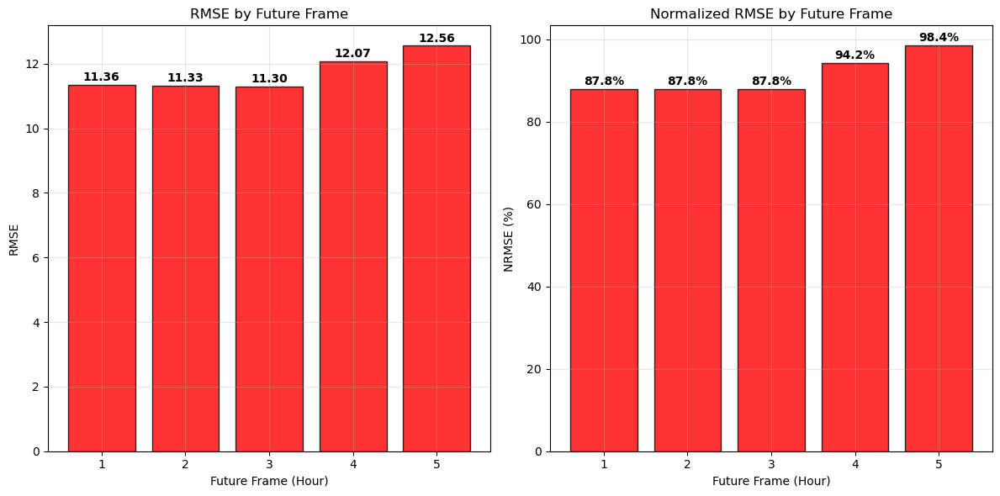


📊 FRAME-BY-FRAME RMSE SUMMARY:
Hour 1: RMSE = 11.355 (87.8%)
Hour 2: RMSE = 11.333 (87.8%)
Hour 3: RMSE = 11.302 (87.8%)
Hour 4: RMSE = 12.073 (94.2%)
Hour 5: RMSE = 12.558 (98.4%)

📍 2. AVERAGE RMSE PER STATION (ALL HOURS)
───────────────────────────────────────────────────────
📍 SPATIAL PERFORMANCE ANALYSIS
This identifies which monitoring stations are consistently difficult for ConvLSTM to predict.
Challenging stations often have complex local meteorology or unique pollution sources.



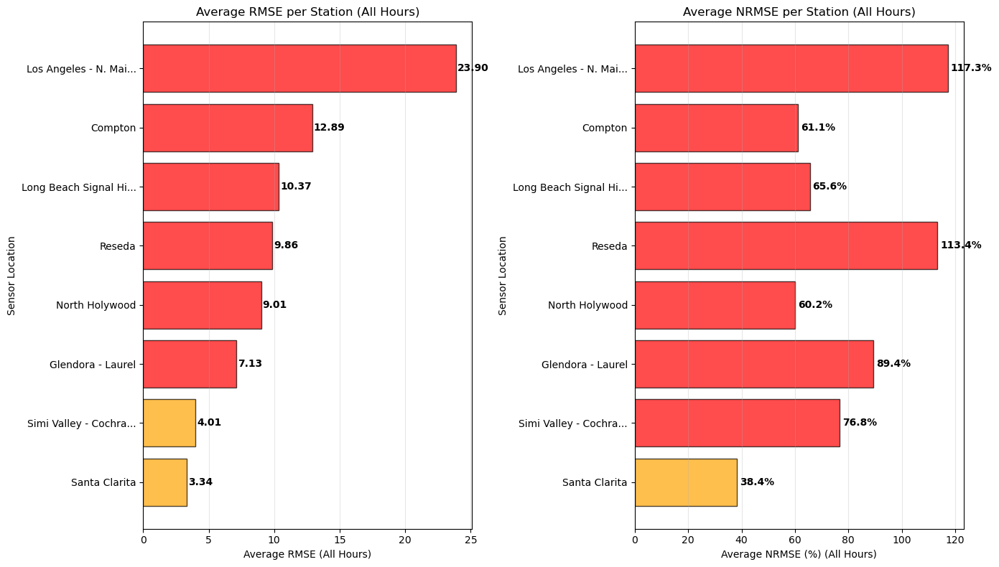


📍 STATION PERFORMANCE SUMMARY (All Hours Combined)

🟢 EXCELLENT Stations (RMSE < 1.5): 0

🟡 GOOD Stations (1.5-3.0): 0

🟠 FAIR Stations (3.0-5.0): 2
   • Santa Clarita: 3.344
   • Simi Valley - Cochran Street: 4.006

🔴 POOR Stations (≥ 5.0): 6
   • Glendora - Laurel: 7.132
   • North Holywood: 9.014
   • Reseda: 9.864
   • Long Beach Signal Hill: 10.368
   • Compton: 12.892
   • Los Angeles - N. Main Street: 23.903

📊 SUMMARY STATISTICS:
   🏆 Best Station:  Santa Clarita (RMSE: 3.344)
   💥 Worst Station: Los Angeles - N. Main Street (RMSE: 23.903)
   📈 Average RMSE:  10.065
   📏 RMSE Range:    20.559
   🎯 Reliability:   0/8 stations ≤ 3.0 RMSE

📊 SUMMARY TABLE - RMSE BY HOUR AND SENSOR
Sensor                   │ Hour 1 │ Hour 2 │ Hour 3 │ Hour 4 │ Hour 5 │  Avg   
─────────────────────────┼────────┼────────┼────────┼────────┼────────┼────────
Simi Valley - Cochran St │  4.10  │  3.99  │  3.94  │  4.00  │  3.99  │  4.01  
Reseda                   │ 10.42  │  9.91  │  9.64  │  9.76  │  

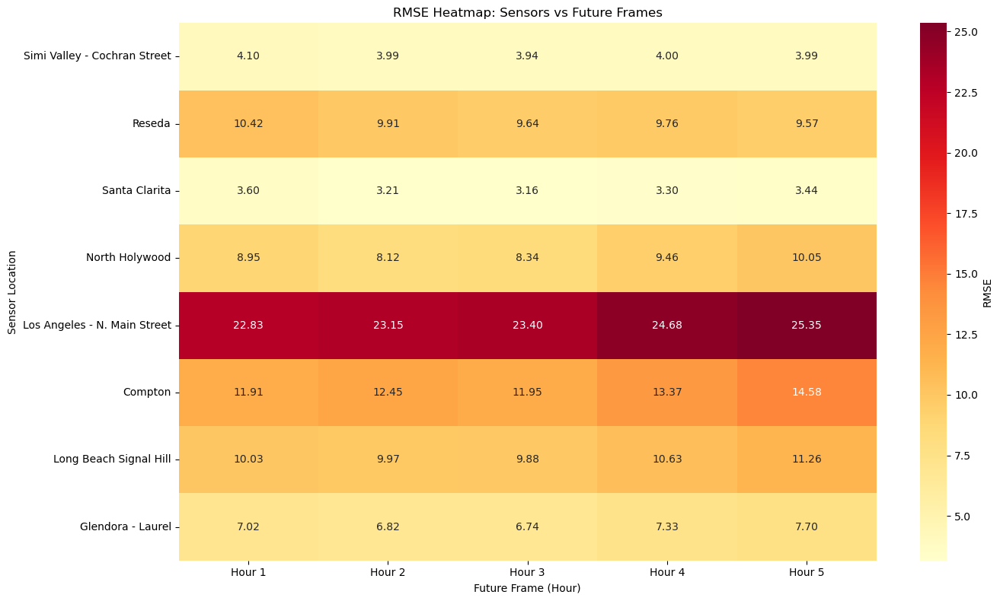


🔥 WORST PERFORMING COMBINATIONS:
Los Angeles - N. Main Street at Hour 5: RMSE = 25.349
Los Angeles - N. Main Street at Hour 4: RMSE = 24.679
Los Angeles - N. Main Street at Hour 3: RMSE = 23.404
Los Angeles - N. Main Street at Hour 2: RMSE = 23.154
Los Angeles - N. Main Street at Hour 1: RMSE = 22.830

📈 4. TIME SERIES BY FRAME
───────────────────────────────────
Temporal pattern analysis

🕐 Hour 1 Time Series


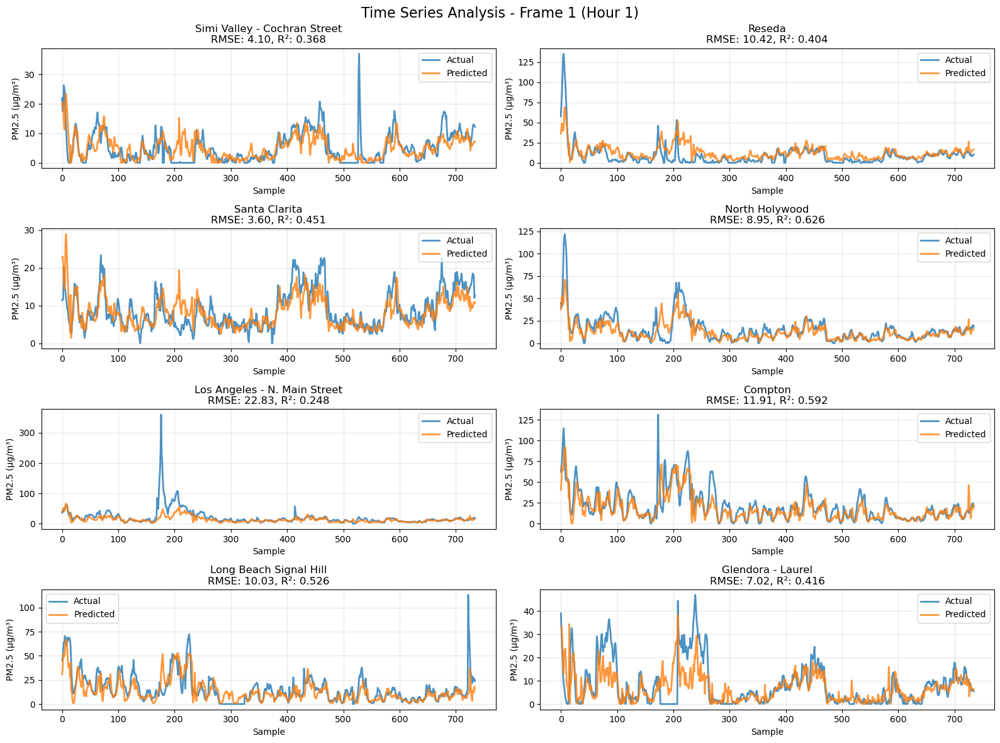


🕐 Hour 2 Time Series


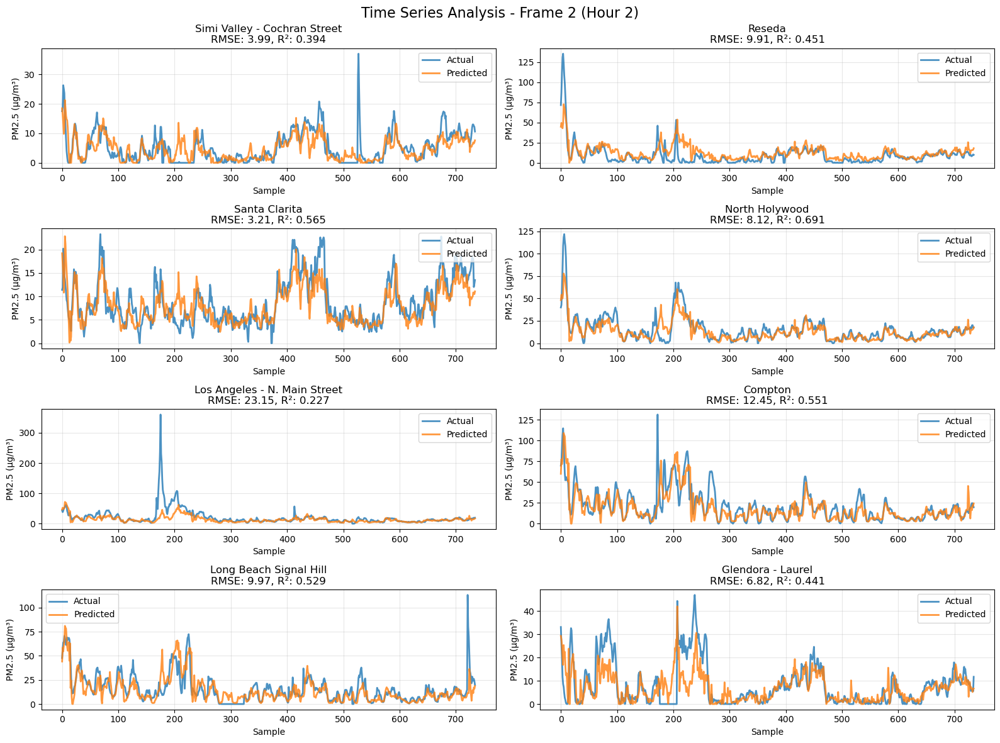


🕐 Hour 3 Time Series


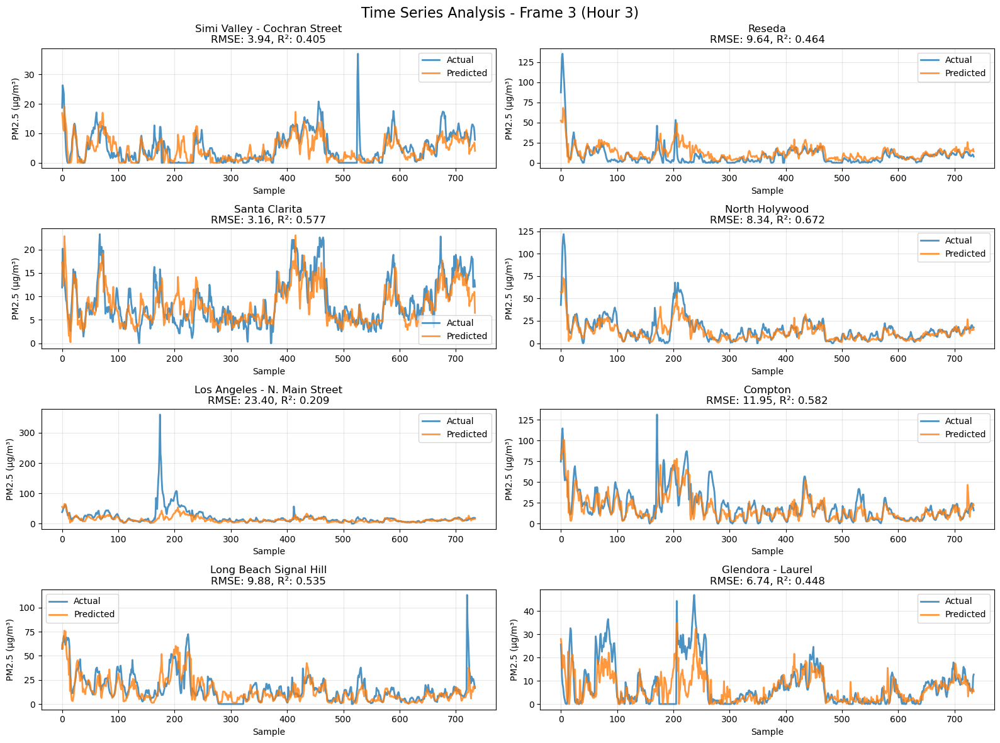


🕐 Hour 4 Time Series


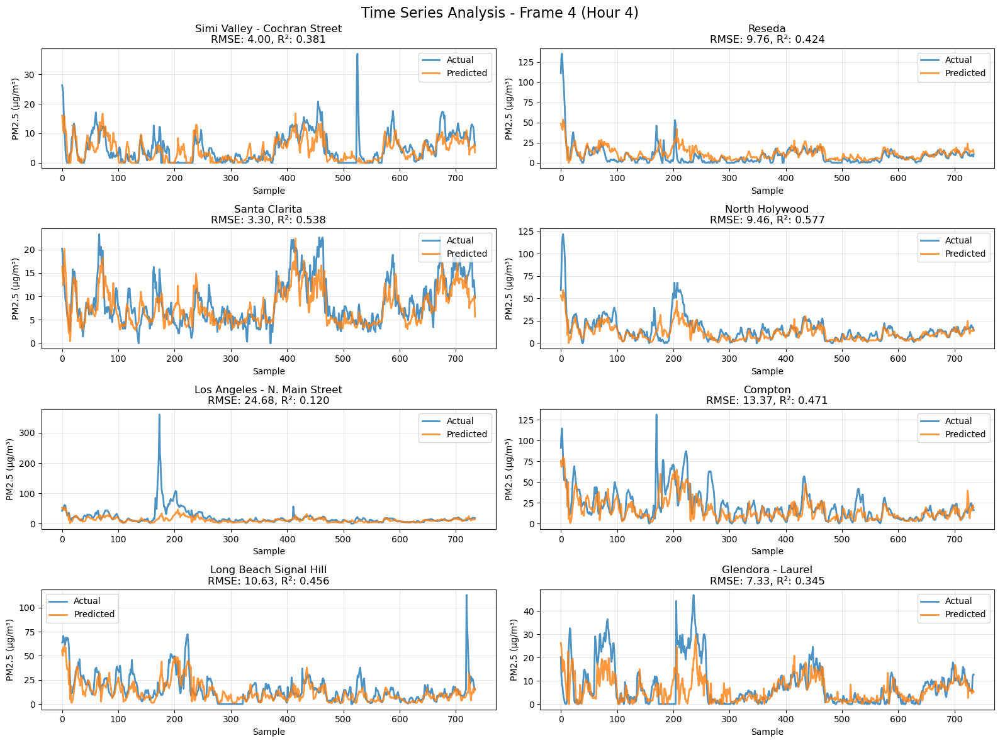


🕐 Hour 5 Time Series


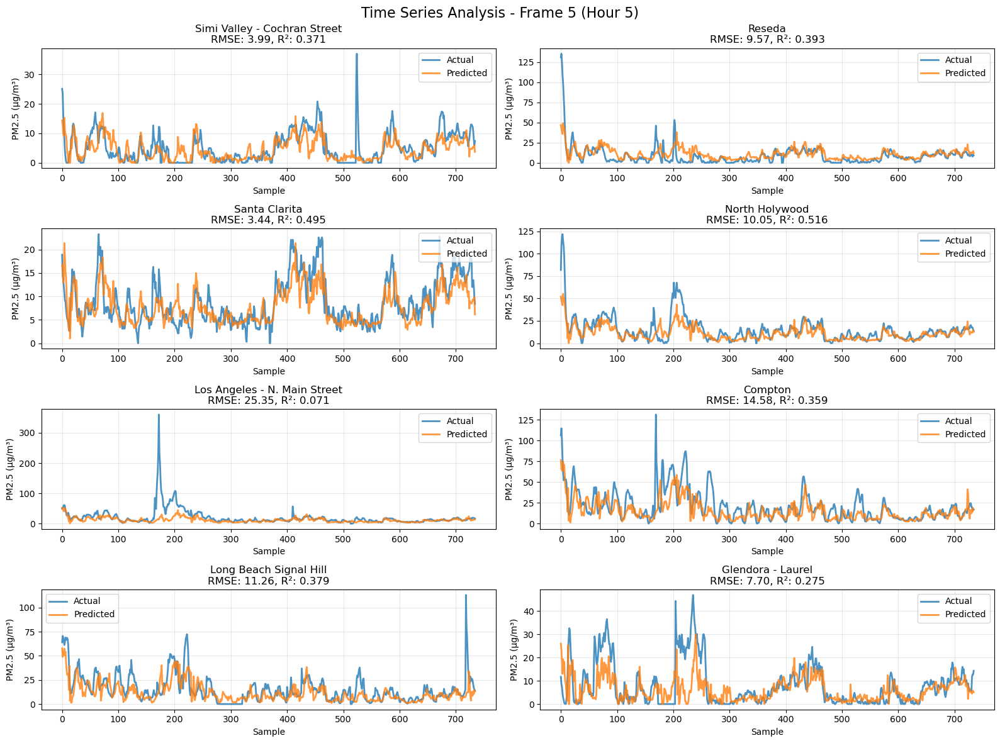


🎯 5. SCATTER PLOTS BY FRAME
───────────────────────────────────
Prediction accuracy assessment for each time frame:

🎯 Hour 1 Scatter Plot


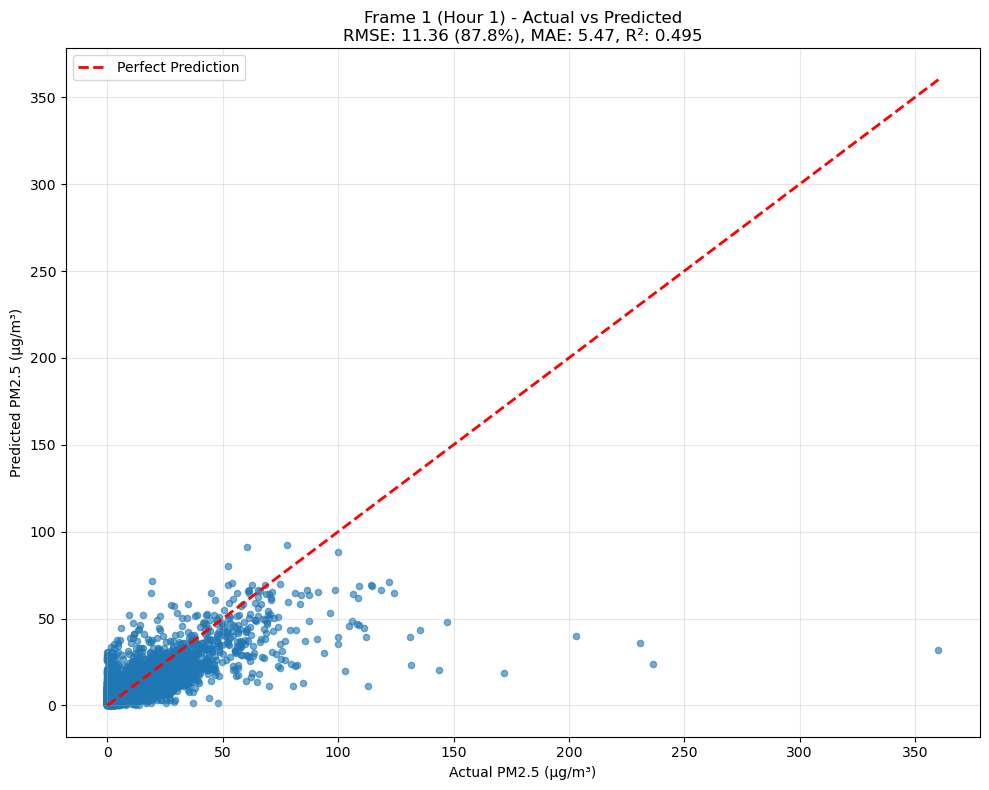


🎯 Hour 2 Scatter Plot


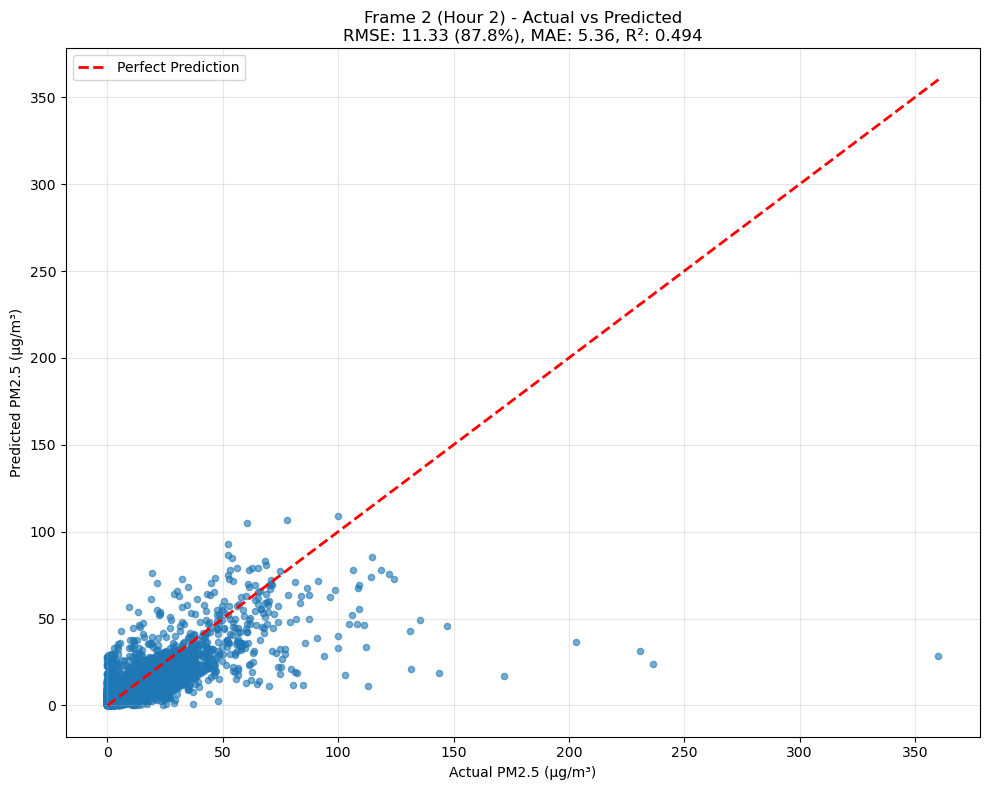


🎯 Hour 3 Scatter Plot


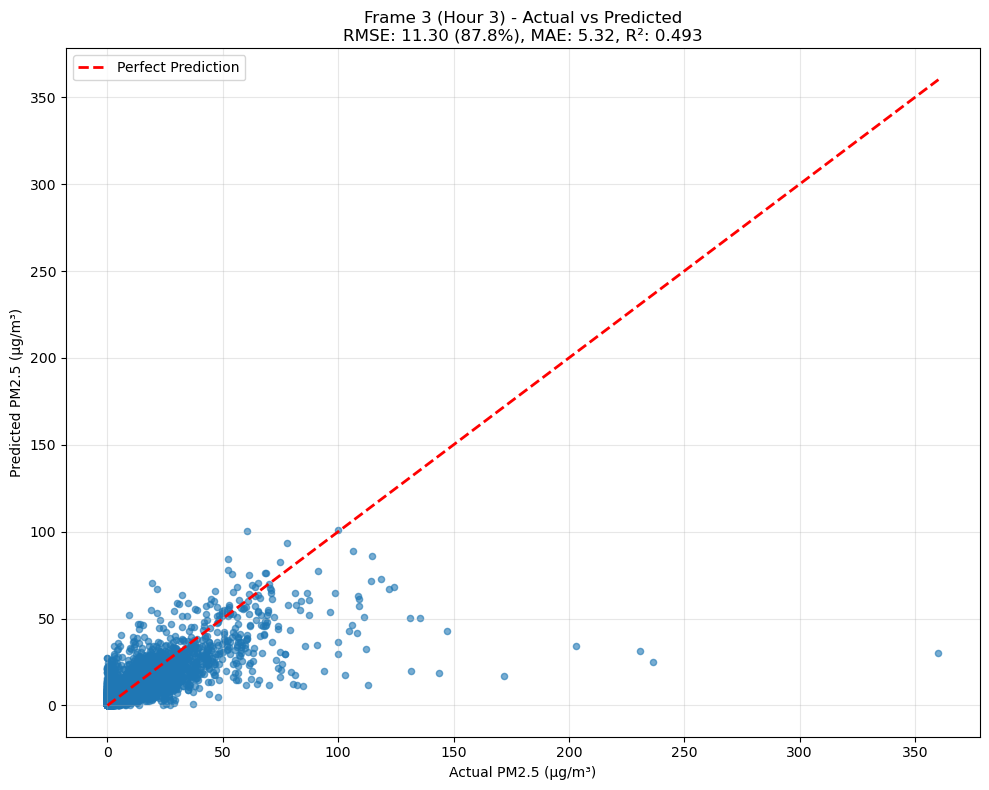


🎯 Hour 4 Scatter Plot


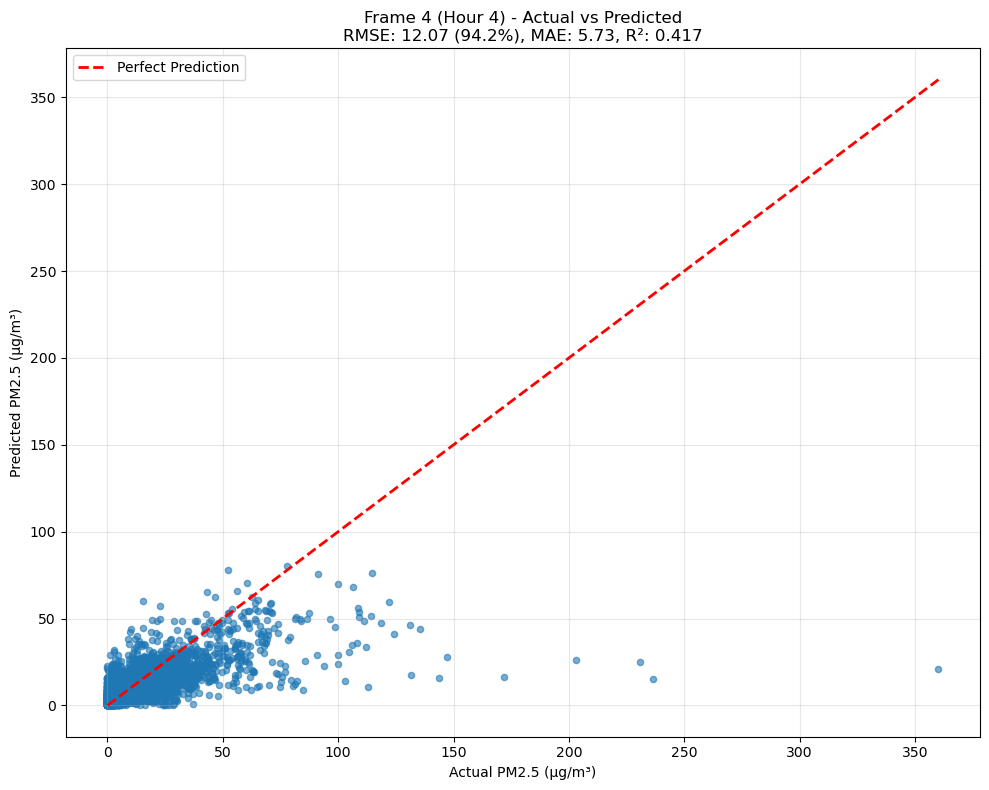


🎯 Hour 5 Scatter Plot


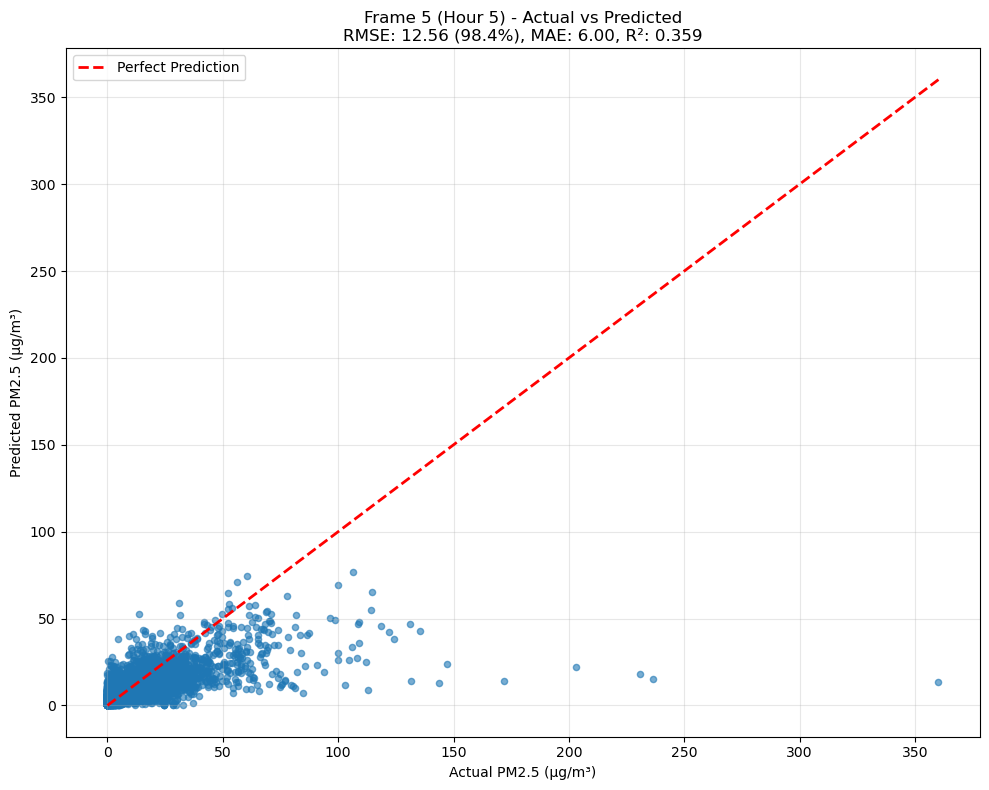

📋 DETAILED CONVLSTM PERFORMANCE BREAKDOWN
This section provides comprehensive metrics for each prediction horizon and monitoring station.
Essential for identifying specific model weaknesses and guiding improvements.

📋 DETAILED FRAME-BY-FRAME STATISTICS

🕐 HOUR 1 ANALYSIS
────────────────────────────────────────────────────────────────────────────────────────────────────
┌─ OVERALL PERFORMANCE ──────────────────────────────────────────────────────────┐
│ RMSE: 11.355 (87.8%)   │   MAE:  5.469   │   R²:  0.495              │
└────────────────────────────────────────────────────────────────────────────────┘

📍 BY SENSOR LOCATION:
────────────────────────────────────────────────────────────────────────────────────────────────────
Location                 │RMSE   │%     │MAE    │R²     │Actual │Pred  
─────────────────────────┼───────┼──────┼───────┼───────┼───────┼──────
Simi Valley - Cochran St │4.10   │78.2  %│2.73   │0.368  │5.2    │4.9   
Reseda                   │10.42  │117.4 %│6.26

In [7]:
import sys
sys.path.append('../..')
from libs.plotting import comprehensive_frame_analysis

# Get sensor names
sensor_names = [
    'Simi Valley - Cochran Street', 'Reseda', 'Santa Clarita', 'North Holywood', 
    'Los Angeles - N. Main Street', 'Compton', 'Long Beach Signal Hill', 'Glendora - Laurel'
]

print(f"\nSensors in {EXPERIMENT_NAME}: {sensor_names}")
print(f"\n=== FRAME-BASED PREDICTION ANALYSIS ===")
print(f"Analyzing {hrrr_y_pred.shape[1]} future frames (hours) for {hrrr_y_pred.shape[2]} sensors") 
comprehensive_frame_analysis(hrrr_y_pred, Y_jan_test, sensor_names)

🎯 COMPREHENSIVE CONVLSTM PERFORMANCE ANALYSIS
📊 Analyzing 5 frames (hours) across 8 sensors
📈 Dataset: 735 samples

This analysis evaluates ConvLSTM's ability to predict air quality across multiple future time frames
and spatial locations, revealing critical spatio-temporal prediction patterns.

📊 1. FRAME-BY-FRAME RMSE
────────────────────────────────────────────────────────────
📊 TEMPORAL DEGRADATION ANALYSIS
This measures how ConvLSTM prediction accuracy degrades as we predict further into the future.
Later time steps are inherently harder to predict due to error accumulation.



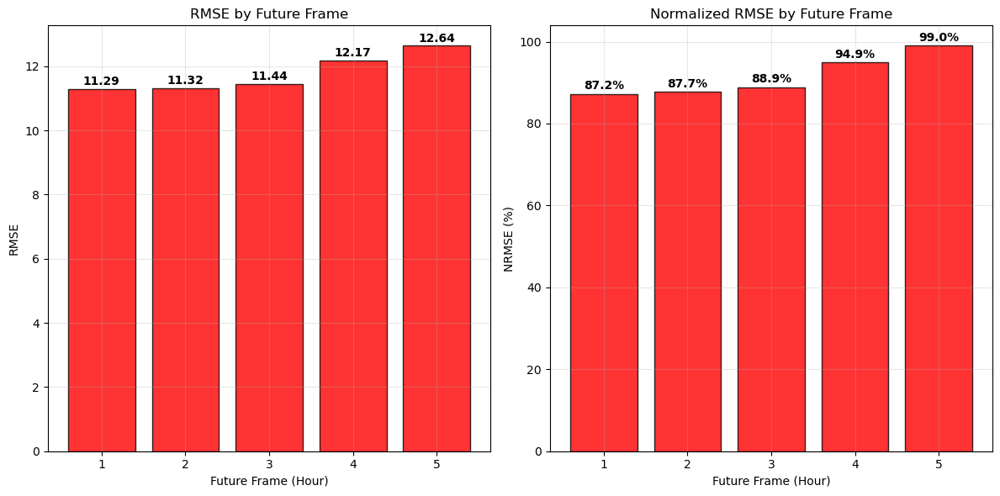


📊 FRAME-BY-FRAME RMSE SUMMARY:
Hour 1: RMSE = 11.286 (87.2%)
Hour 2: RMSE = 11.319 (87.7%)
Hour 3: RMSE = 11.437 (88.9%)
Hour 4: RMSE = 12.167 (94.9%)
Hour 5: RMSE = 12.636 (99.0%)

📍 2. AVERAGE RMSE PER STATION (ALL HOURS)
───────────────────────────────────────────────────────
📍 SPATIAL PERFORMANCE ANALYSIS
This identifies which monitoring stations are consistently difficult for ConvLSTM to predict.
Challenging stations often have complex local meteorology or unique pollution sources.



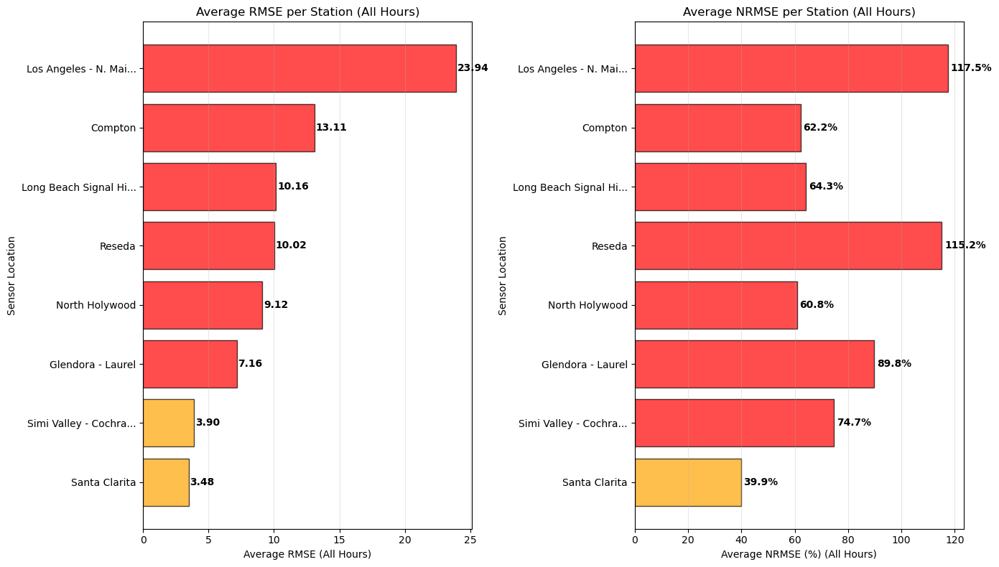


📍 STATION PERFORMANCE SUMMARY (All Hours Combined)

🟢 EXCELLENT Stations (RMSE < 1.5): 0

🟡 GOOD Stations (1.5-3.0): 0

🟠 FAIR Stations (3.0-5.0): 2
   • Santa Clarita: 3.477
   • Simi Valley - Cochran Street: 3.899

🔴 POOR Stations (≥ 5.0): 6
   • Glendora - Laurel: 7.159
   • North Holywood: 9.116
   • Reseda: 10.022
   • Long Beach Signal Hill: 10.158
   • Compton: 13.109
   • Los Angeles - N. Main Street: 23.944

📊 SUMMARY STATISTICS:
   🏆 Best Station:  Santa Clarita (RMSE: 3.477)
   💥 Worst Station: Los Angeles - N. Main Street (RMSE: 23.944)
   📈 Average RMSE:  10.111
   📏 RMSE Range:    20.467
   🎯 Reliability:   0/8 stations ≤ 3.0 RMSE

📊 SUMMARY TABLE - RMSE BY HOUR AND SENSOR
Sensor                   │ Hour 1 │ Hour 2 │ Hour 3 │ Hour 4 │ Hour 5 │  Avg   
─────────────────────────┼────────┼────────┼────────┼────────┼────────┼────────
Simi Valley - Cochran St │  4.21  │  3.87  │  3.72  │  3.80  │  3.87  │  3.89  
Reseda                   │ 10.39  │ 10.26  │  9.95  │  9.92  │ 

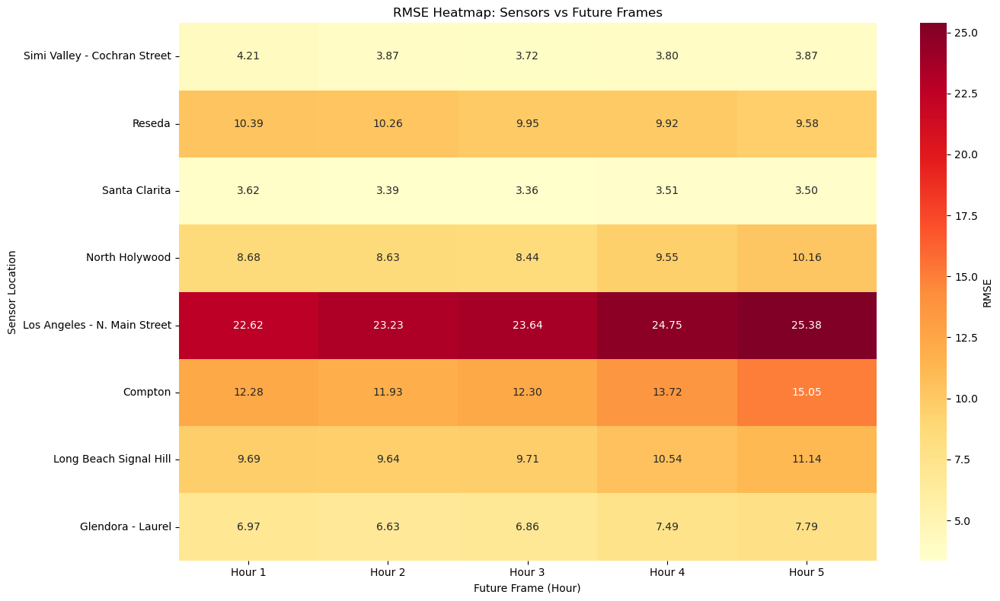


🔥 WORST PERFORMING COMBINATIONS:
Los Angeles - N. Main Street at Hour 5: RMSE = 25.380
Los Angeles - N. Main Street at Hour 4: RMSE = 24.748
Los Angeles - N. Main Street at Hour 3: RMSE = 23.636
Los Angeles - N. Main Street at Hour 2: RMSE = 23.231
Los Angeles - N. Main Street at Hour 1: RMSE = 22.618

📈 4. TIME SERIES BY FRAME
───────────────────────────────────
Temporal pattern analysis

🕐 Hour 1 Time Series


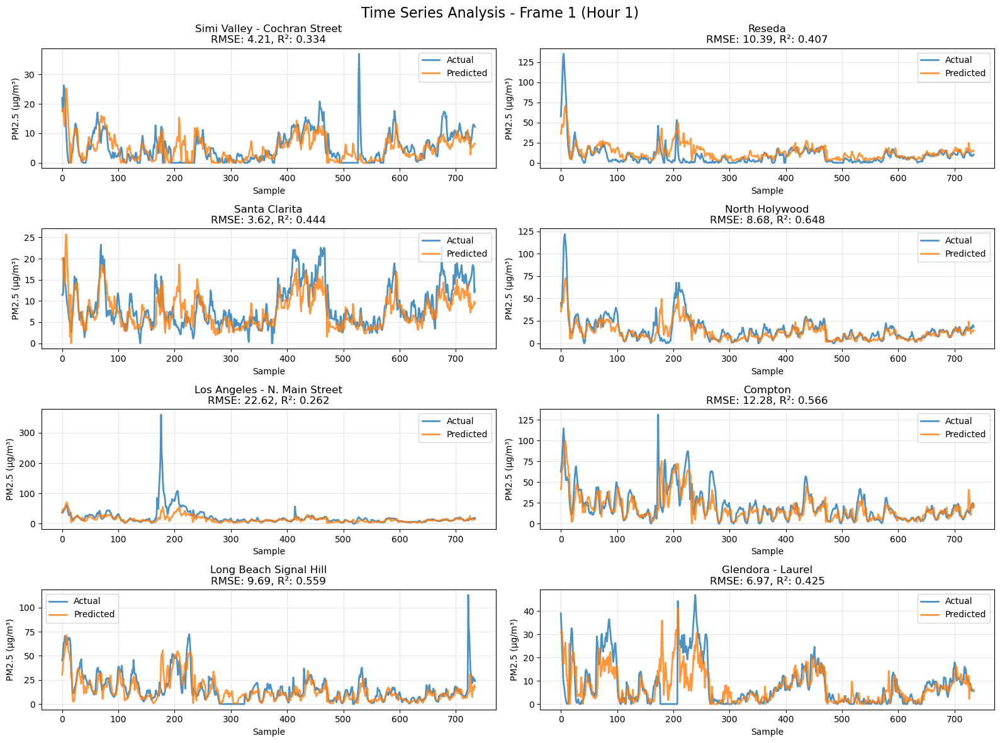


🕐 Hour 2 Time Series


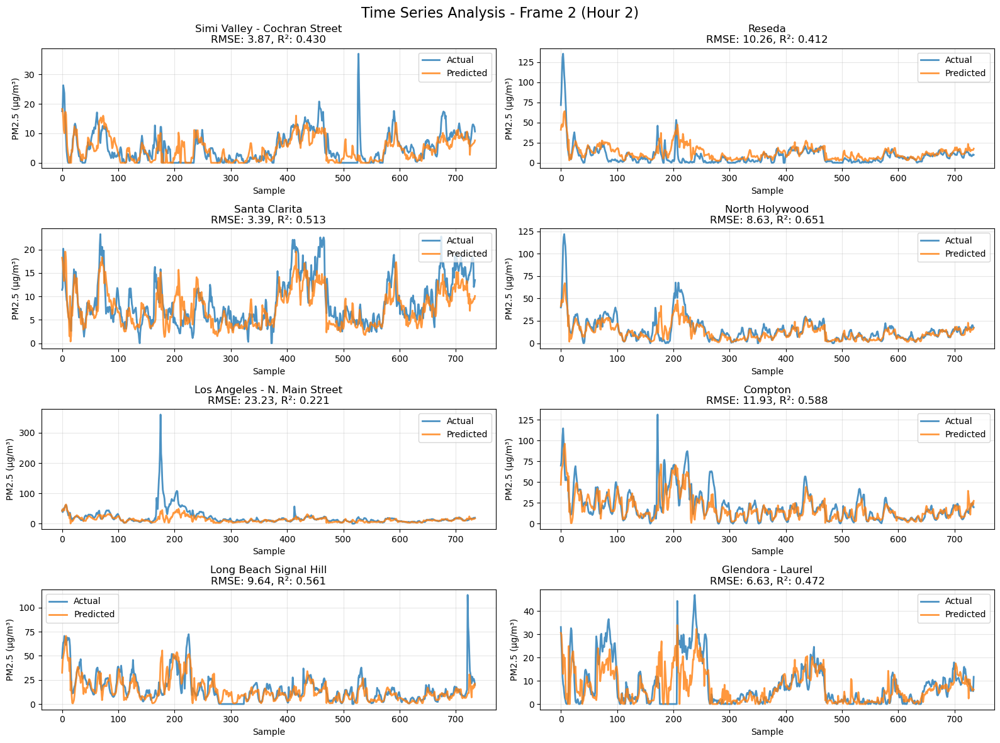


🕐 Hour 3 Time Series


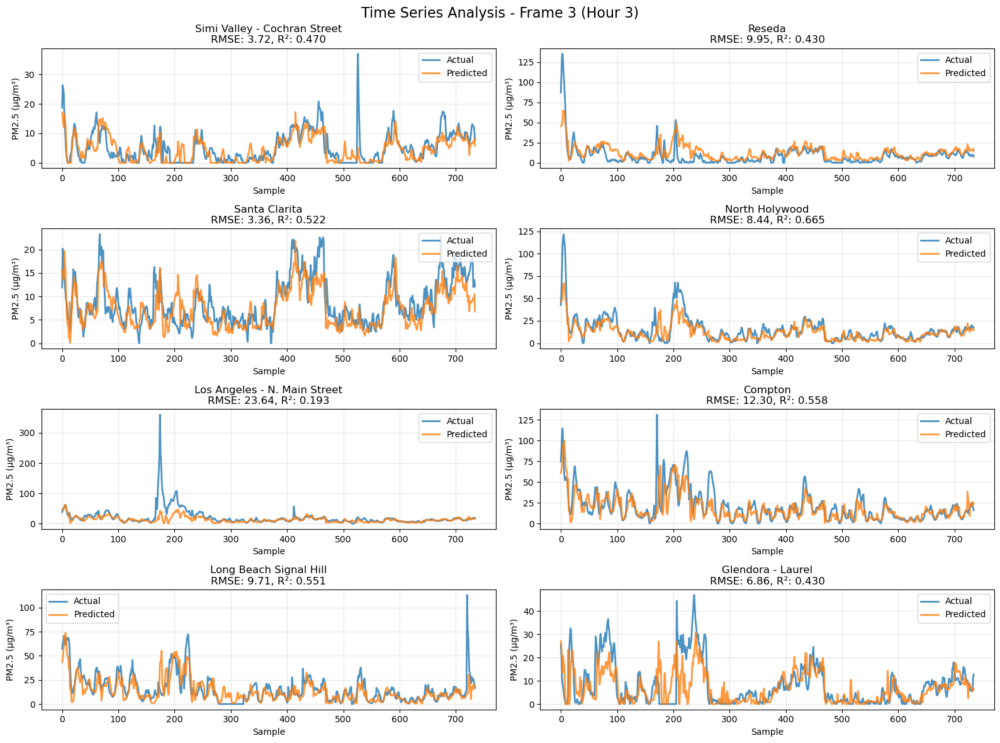


🕐 Hour 4 Time Series


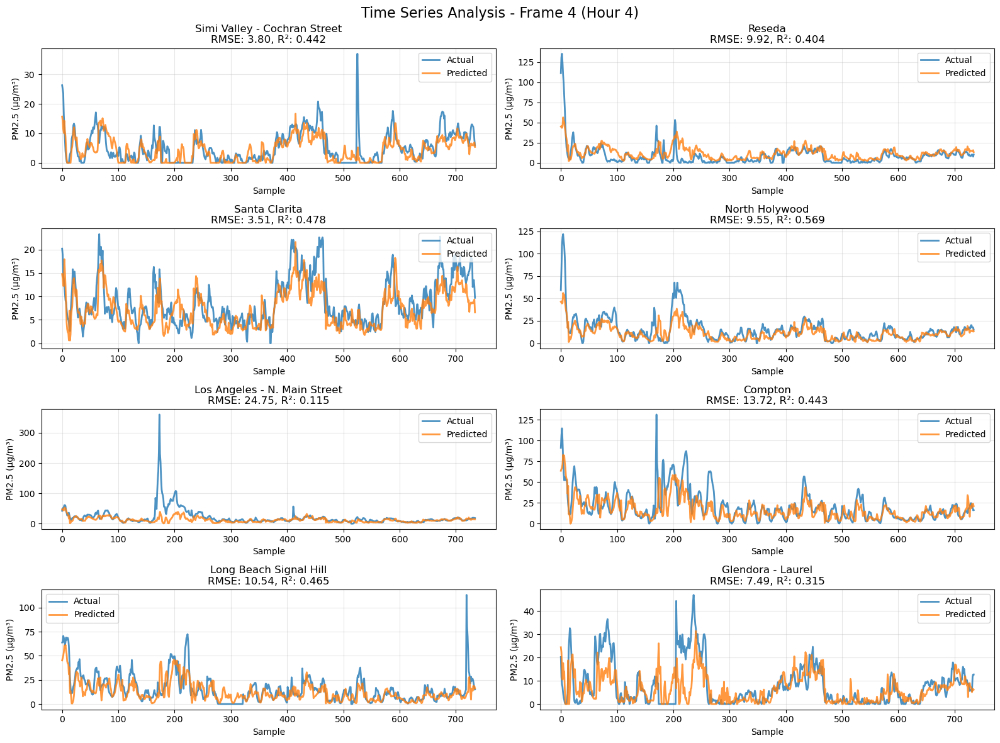


🕐 Hour 5 Time Series


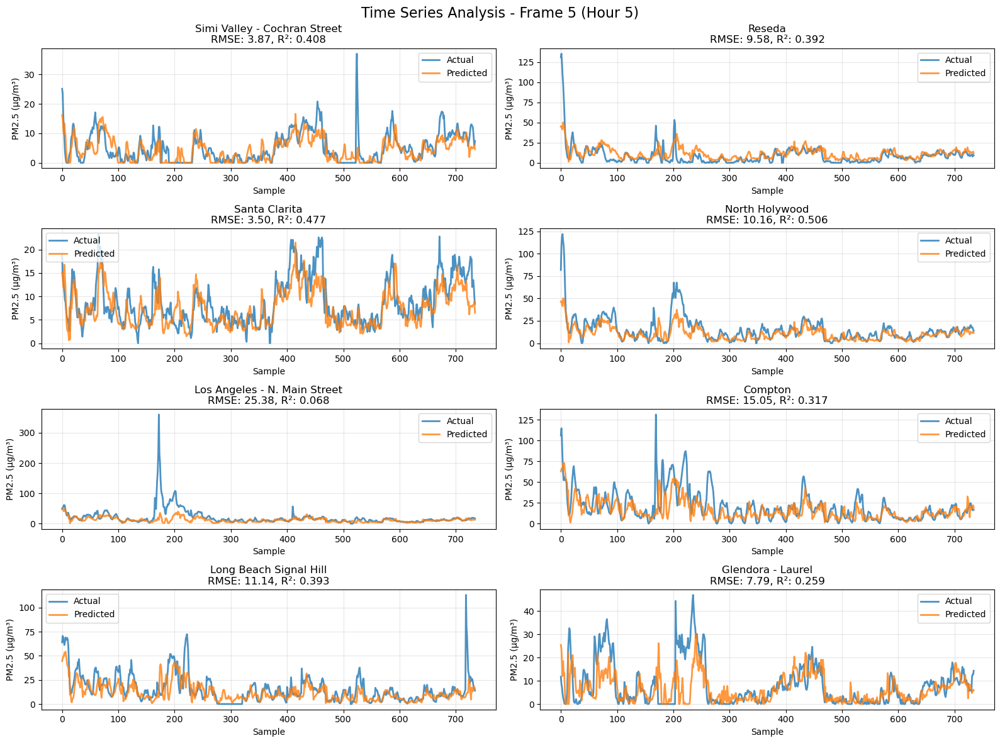


🎯 5. SCATTER PLOTS BY FRAME
───────────────────────────────────
Prediction accuracy assessment for each time frame:

🎯 Hour 1 Scatter Plot


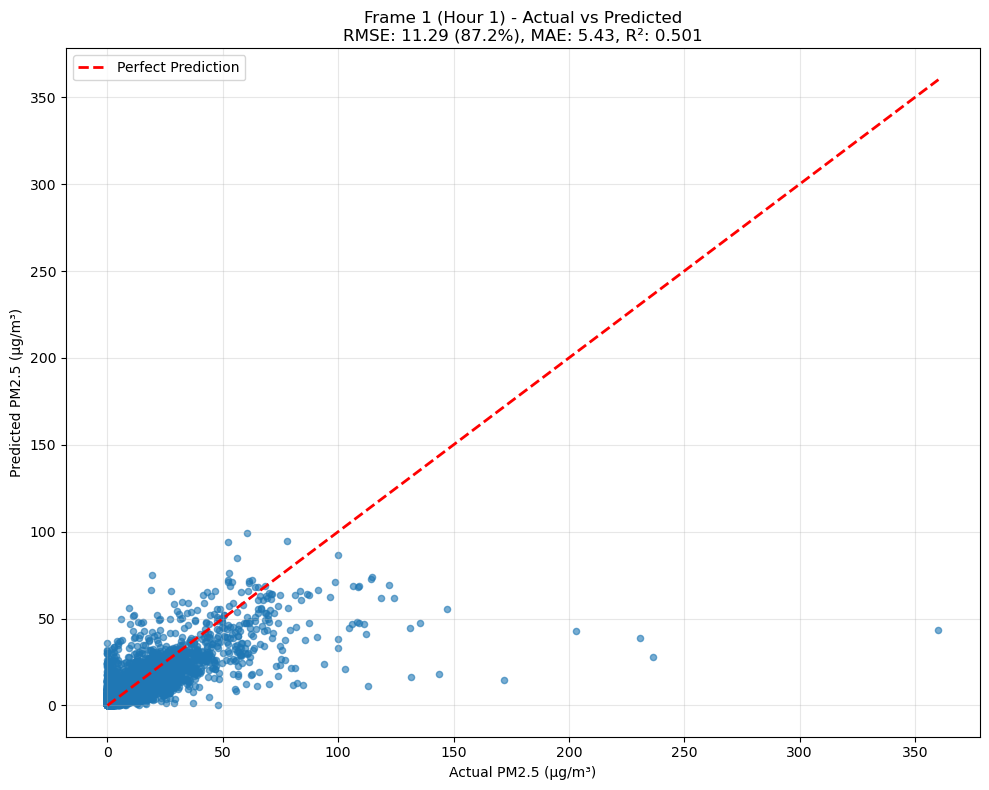


🎯 Hour 2 Scatter Plot


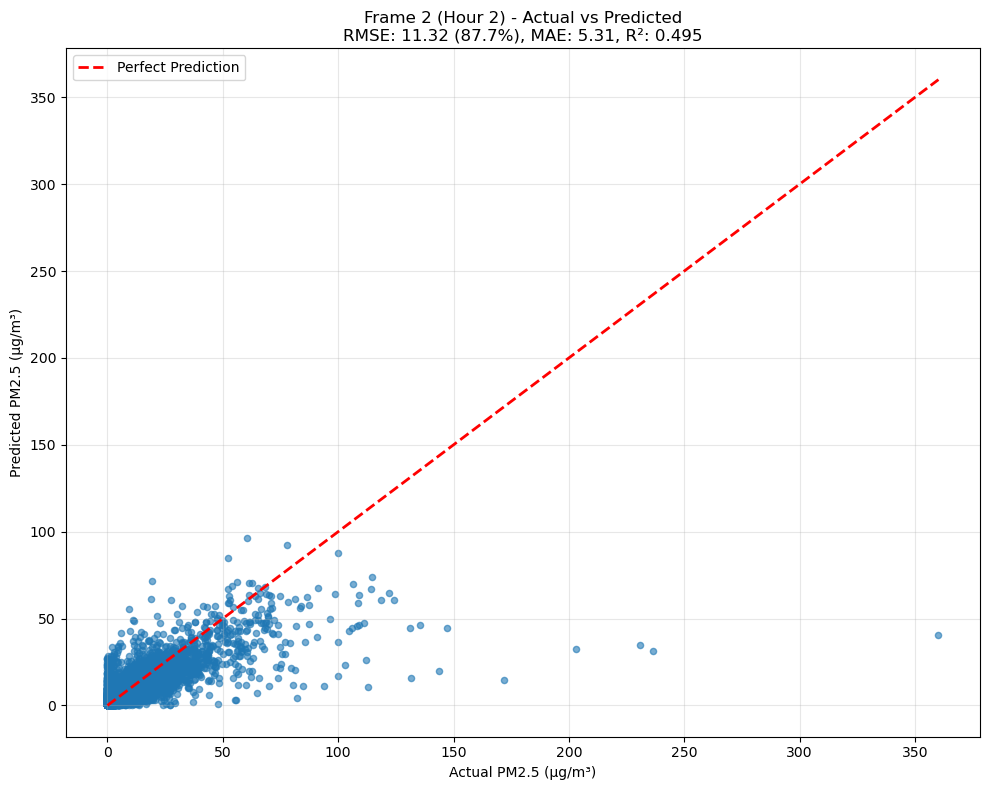


🎯 Hour 3 Scatter Plot


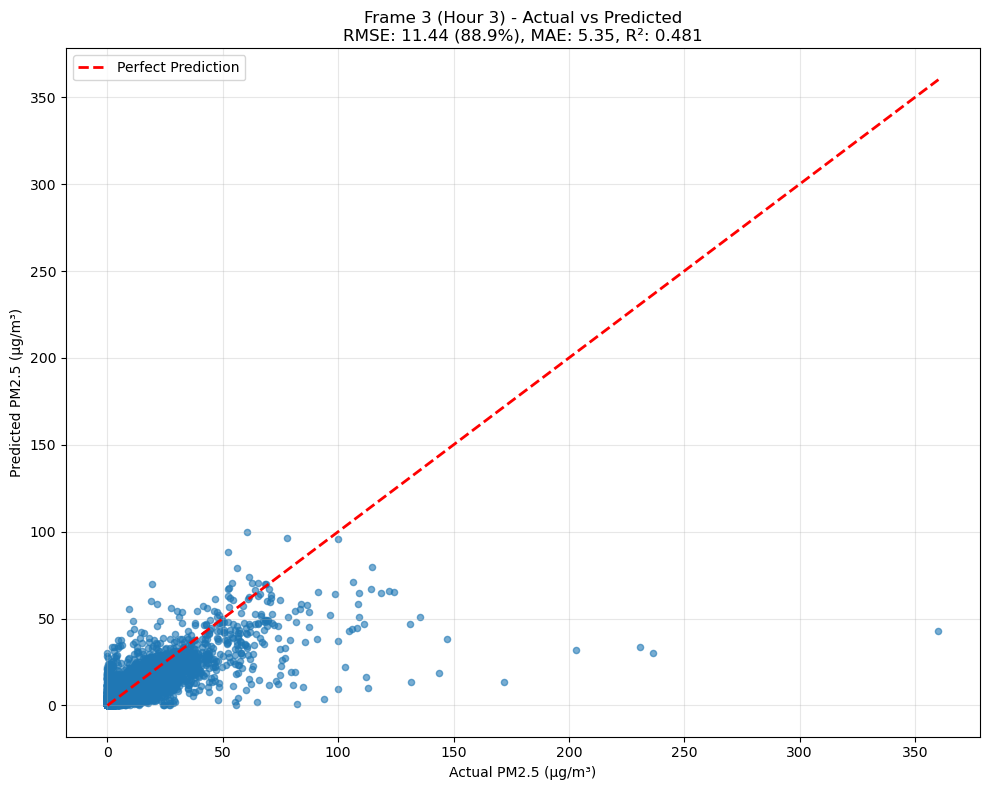


🎯 Hour 4 Scatter Plot


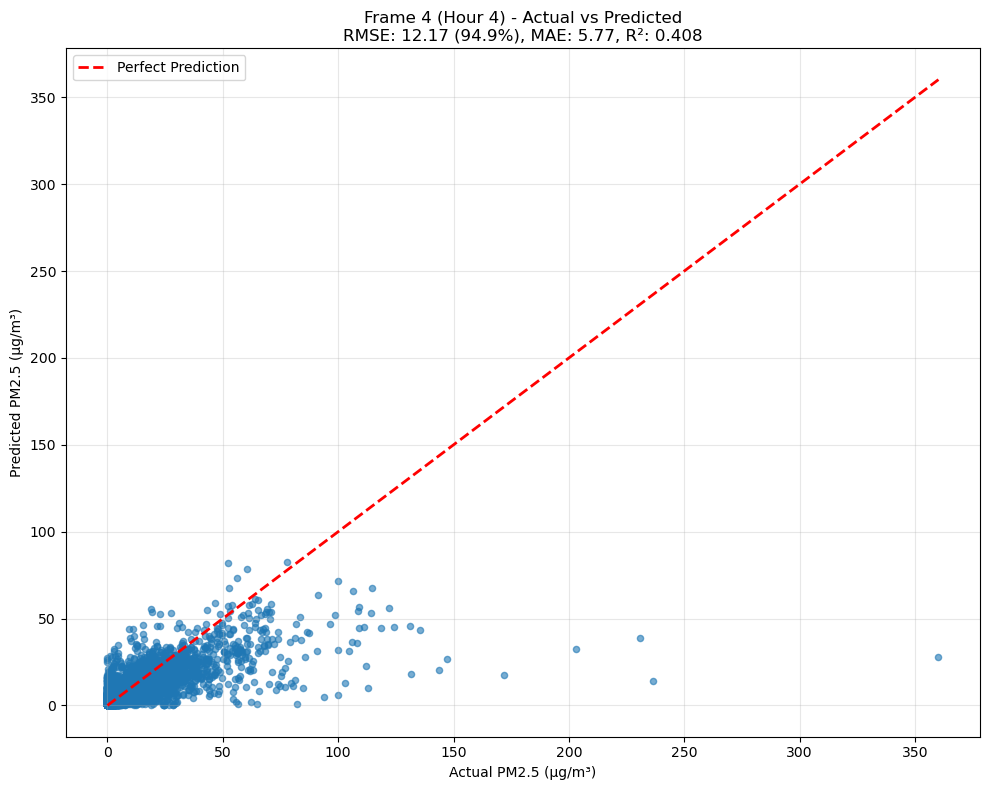


🎯 Hour 5 Scatter Plot


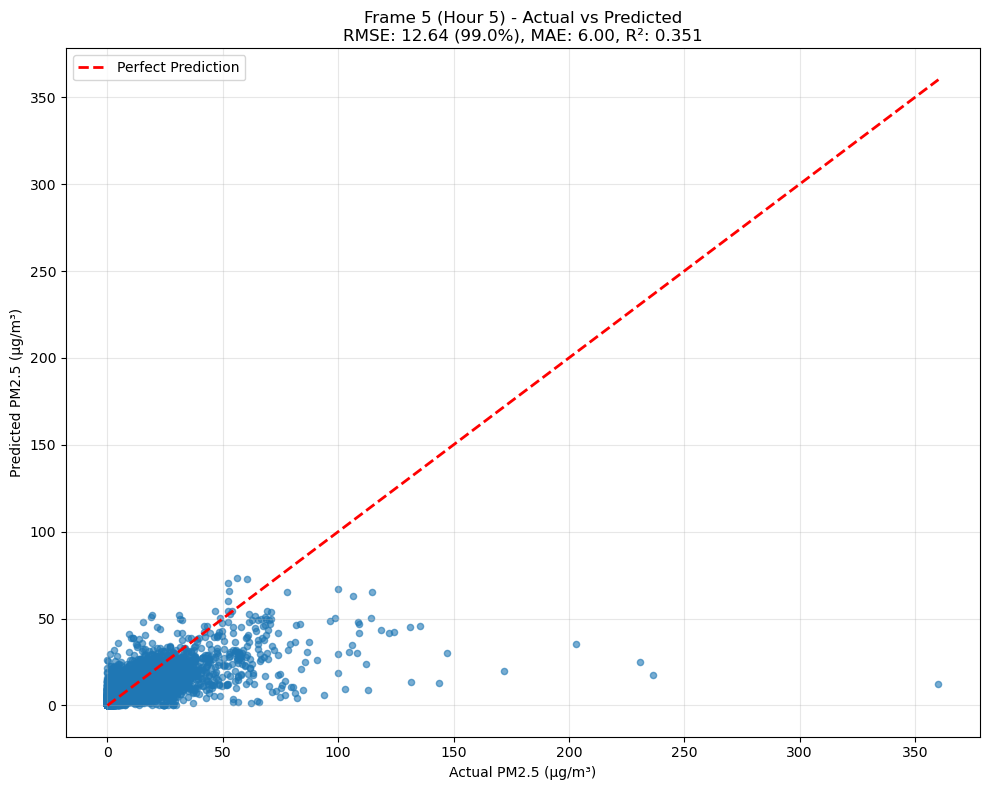

📋 DETAILED CONVLSTM PERFORMANCE BREAKDOWN
This section provides comprehensive metrics for each prediction horizon and monitoring station.
Essential for identifying specific model weaknesses and guiding improvements.

📋 DETAILED FRAME-BY-FRAME STATISTICS

🕐 HOUR 1 ANALYSIS
────────────────────────────────────────────────────────────────────────────────────────────────────
┌─ OVERALL PERFORMANCE ──────────────────────────────────────────────────────────┐
│ RMSE: 11.286 (87.2%)   │   MAE:  5.426   │   R²:  0.501              │
└────────────────────────────────────────────────────────────────────────────────┘

📍 BY SENSOR LOCATION:
────────────────────────────────────────────────────────────────────────────────────────────────────
Location                 │RMSE   │%     │MAE    │R²     │Actual │Pred  
─────────────────────────┼───────┼──────┼───────┼───────┼───────┼──────
Simi Valley - Cochran St │4.21   │80.3  %│2.80   │0.334  │5.2    │4.9   
Reseda                   │10.39  │117.1 %│6.34

In [8]:
comprehensive_frame_analysis(pwwb_y_pred, Y_jan_test, sensor_names)

# Smoothed Analysis
Ignores sensors that were offline; default assumes perfect prediction for dead sensors.

Total number of stations: 29400
Number of stations that reported exactly 0 PM2.5, replaced with y_pred: 1715
Percent of stations replaced: 5.83%
🎯 COMPREHENSIVE CONVLSTM PERFORMANCE ANALYSIS
📊 Analyzing 5 frames (hours) across 8 sensors
📈 Dataset: 735 samples

This analysis evaluates ConvLSTM's ability to predict air quality across multiple future time frames
and spatial locations, revealing critical spatio-temporal prediction patterns.

📊 1. FRAME-BY-FRAME RMSE
────────────────────────────────────────────────────────────
📊 TEMPORAL DEGRADATION ANALYSIS
This measures how ConvLSTM prediction accuracy degrades as we predict further into the future.
Later time steps are inherently harder to predict due to error accumulation.



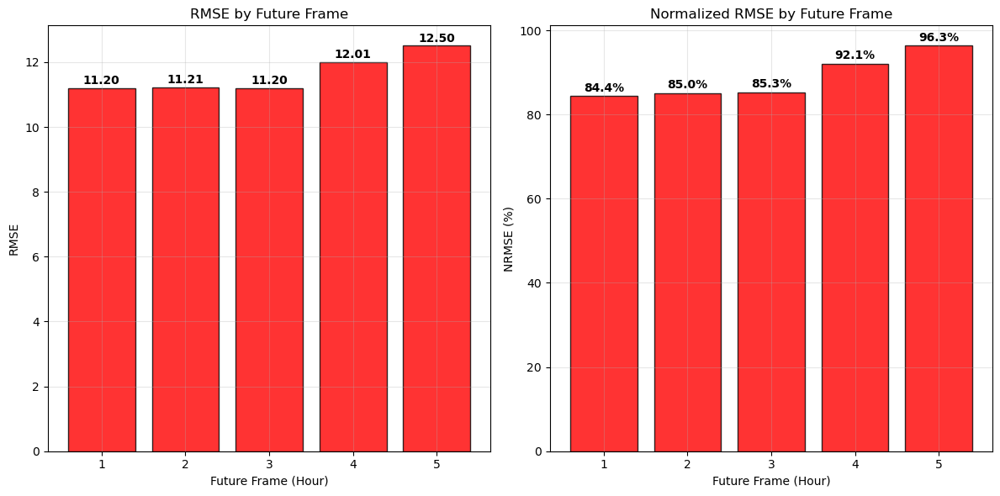


📊 FRAME-BY-FRAME RMSE SUMMARY:
Hour 1: RMSE = 11.196 (84.4%)
Hour 2: RMSE = 11.210 (85.0%)
Hour 3: RMSE = 11.196 (85.3%)
Hour 4: RMSE = 12.007 (92.1%)
Hour 5: RMSE = 12.504 (96.3%)

📍 2. AVERAGE RMSE PER STATION (ALL HOURS)
───────────────────────────────────────────────────────
📍 SPATIAL PERFORMANCE ANALYSIS
This identifies which monitoring stations are consistently difficult for ConvLSTM to predict.
Challenging stations often have complex local meteorology or unique pollution sources.



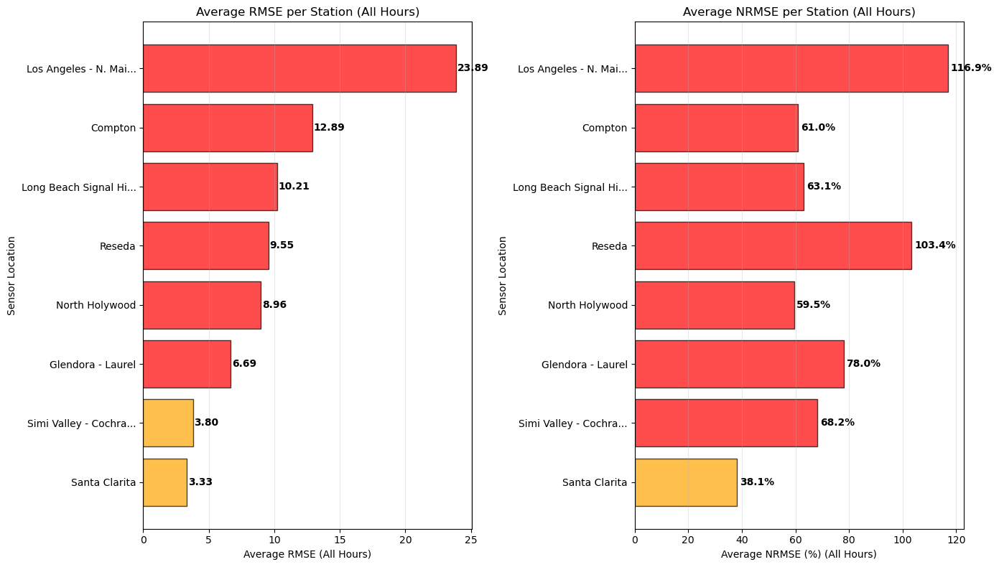


📍 STATION PERFORMANCE SUMMARY (All Hours Combined)

🟢 EXCELLENT Stations (RMSE < 1.5): 0

🟡 GOOD Stations (1.5-3.0): 0

🟠 FAIR Stations (3.0-5.0): 2
   • Santa Clarita: 3.330
   • Simi Valley - Cochran Street: 3.804

🔴 POOR Stations (≥ 5.0): 6
   • Glendora - Laurel: 6.692
   • North Holywood: 8.959
   • Reseda: 9.552
   • Long Beach Signal Hill: 10.211
   • Compton: 12.888
   • Los Angeles - N. Main Street: 23.891

📊 SUMMARY STATISTICS:
   🏆 Best Station:  Santa Clarita (RMSE: 3.330)
   💥 Worst Station: Los Angeles - N. Main Street (RMSE: 23.891)
   📈 Average RMSE:  9.916
   📏 RMSE Range:    20.561
   🎯 Reliability:   0/8 stations ≤ 3.0 RMSE

📊 SUMMARY TABLE - RMSE BY HOUR AND SENSOR
Sensor                   │ Hour 1 │ Hour 2 │ Hour 3 │ Hour 4 │ Hour 5 │  Avg   
─────────────────────────┼────────┼────────┼────────┼────────┼────────┼────────
Simi Valley - Cochran St │  3.69  │  3.76  │  3.78  │  3.92  │  3.88  │  3.80  
Reseda                   │  9.99  │  9.56  │  9.31  │  9.51  │  9

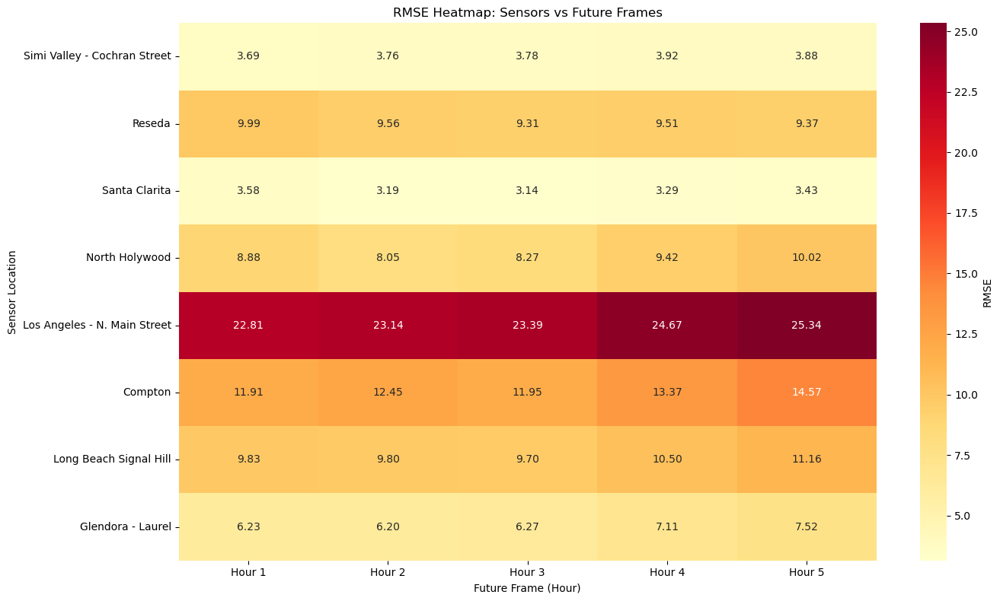


🔥 WORST PERFORMING COMBINATIONS:
Los Angeles - N. Main Street at Hour 5: RMSE = 25.343
Los Angeles - N. Main Street at Hour 4: RMSE = 24.669
Los Angeles - N. Main Street at Hour 3: RMSE = 23.392
Los Angeles - N. Main Street at Hour 2: RMSE = 23.139
Los Angeles - N. Main Street at Hour 1: RMSE = 22.813

📈 4. TIME SERIES BY FRAME
───────────────────────────────────
Temporal pattern analysis

🕐 Hour 1 Time Series


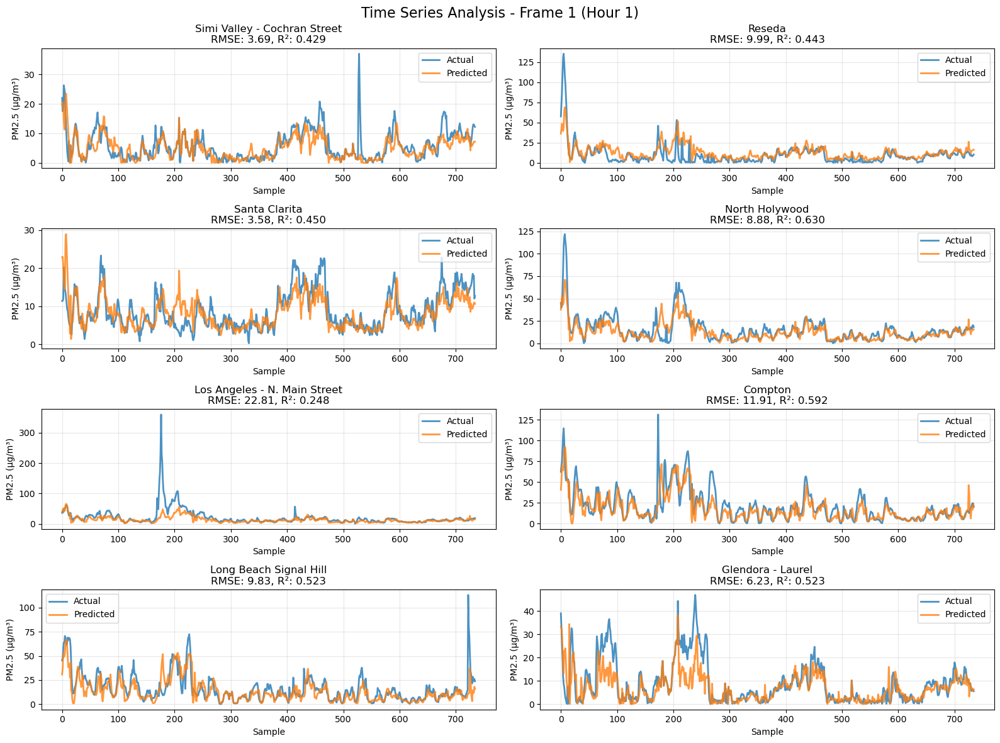


🕐 Hour 2 Time Series


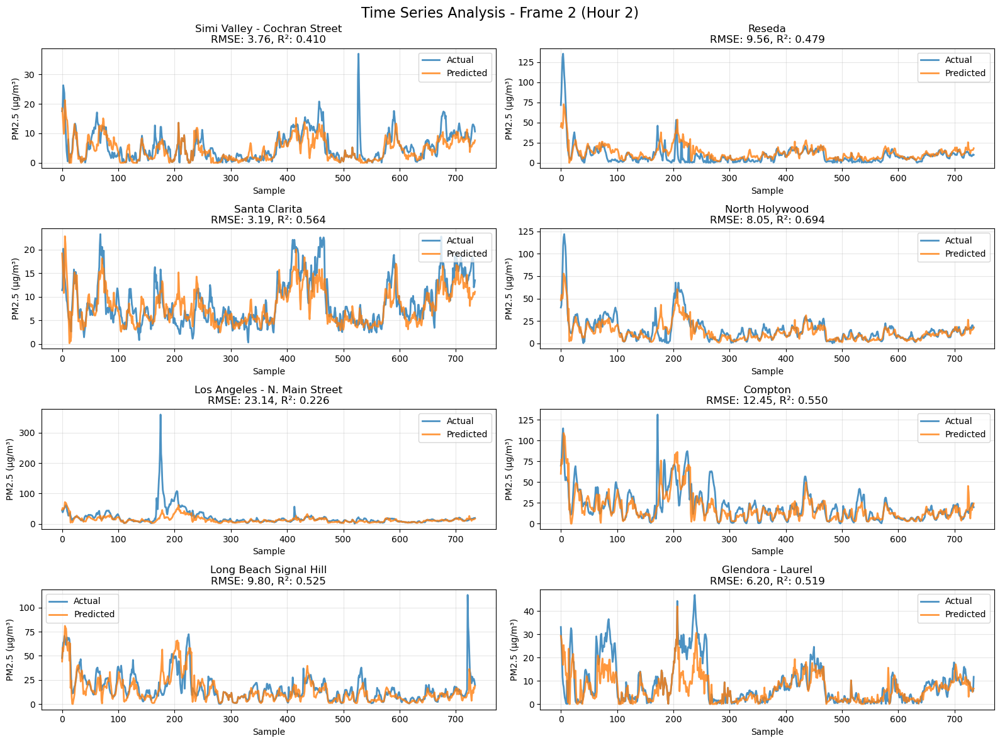


🕐 Hour 3 Time Series


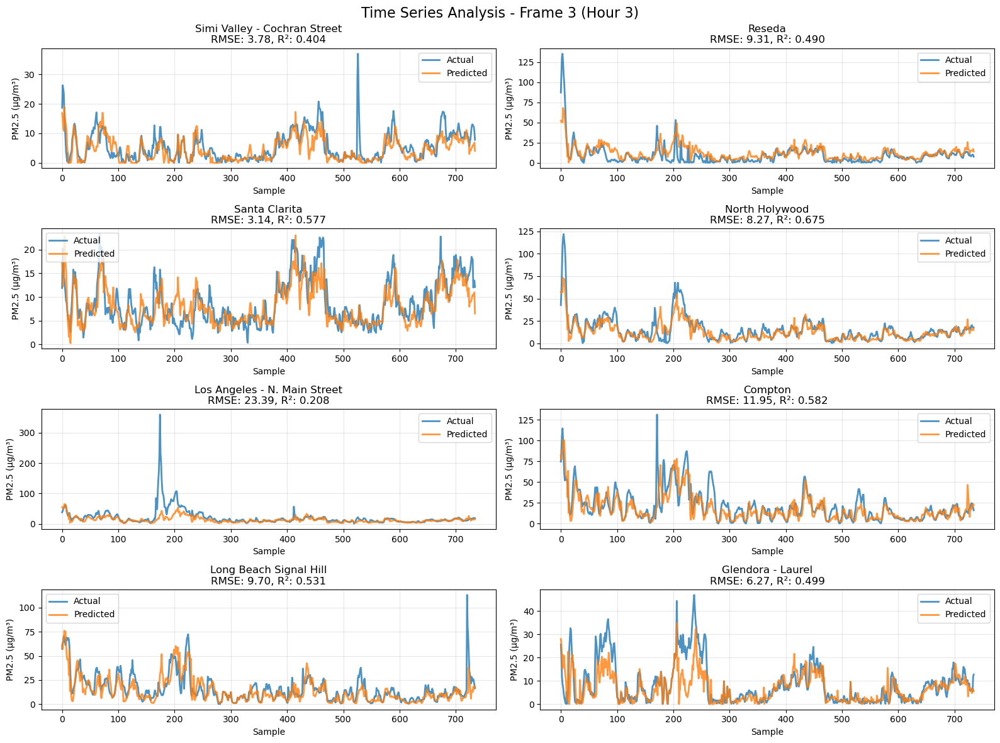


🕐 Hour 4 Time Series


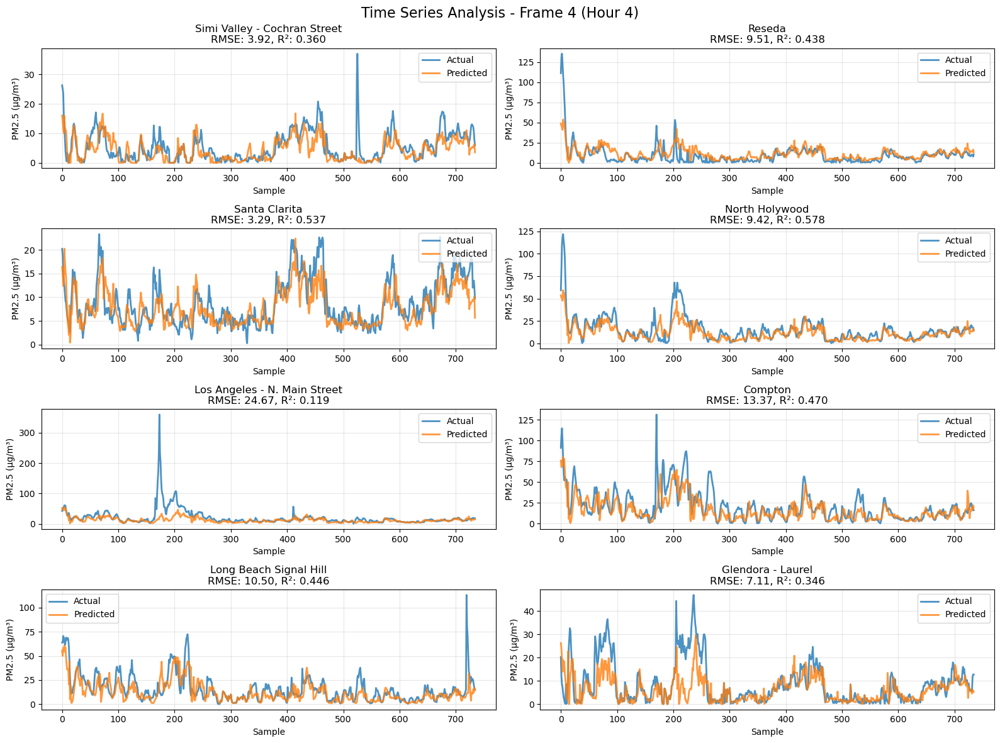


🕐 Hour 5 Time Series


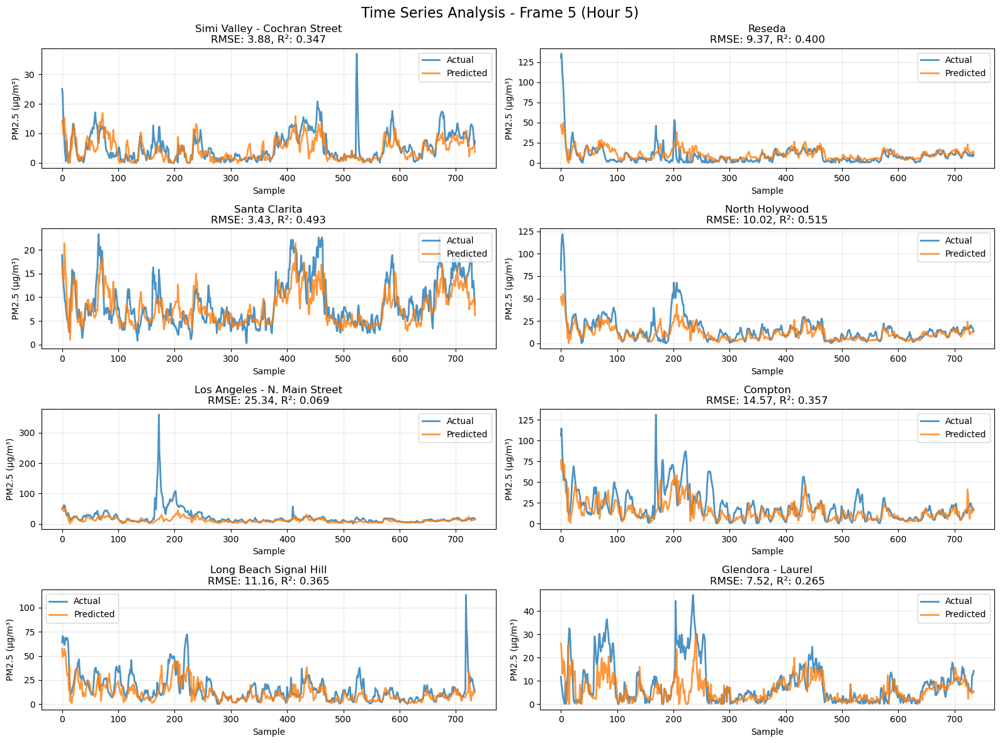


🎯 5. SCATTER PLOTS BY FRAME
───────────────────────────────────
Prediction accuracy assessment for each time frame:

🎯 Hour 1 Scatter Plot


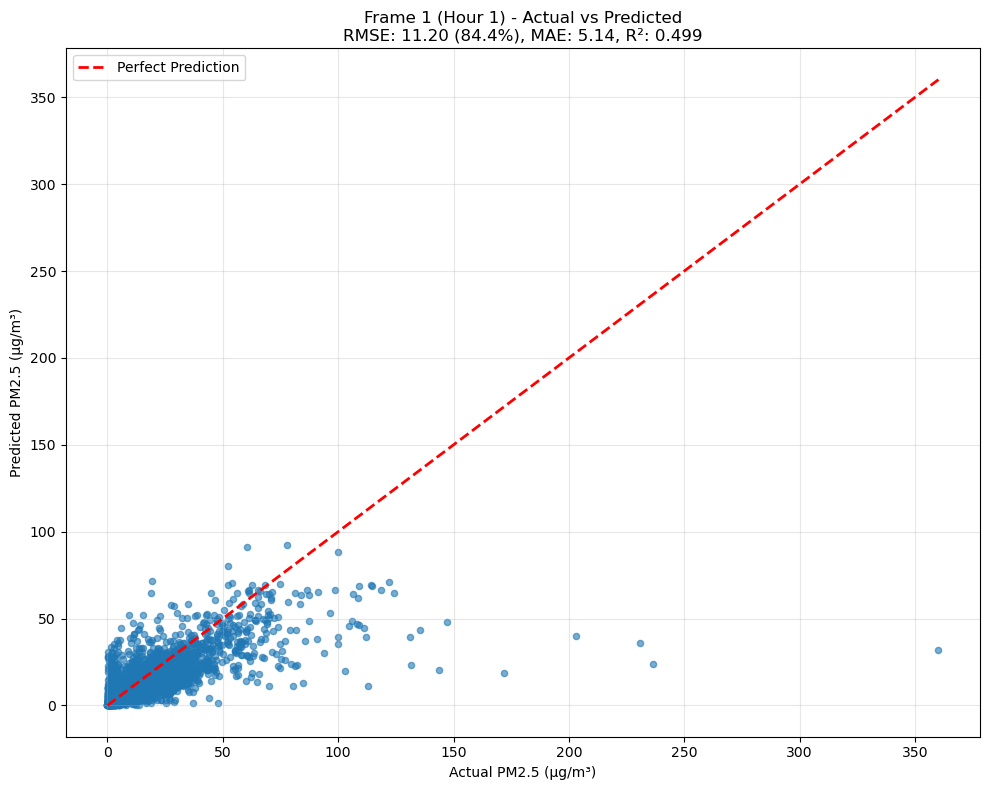


🎯 Hour 2 Scatter Plot


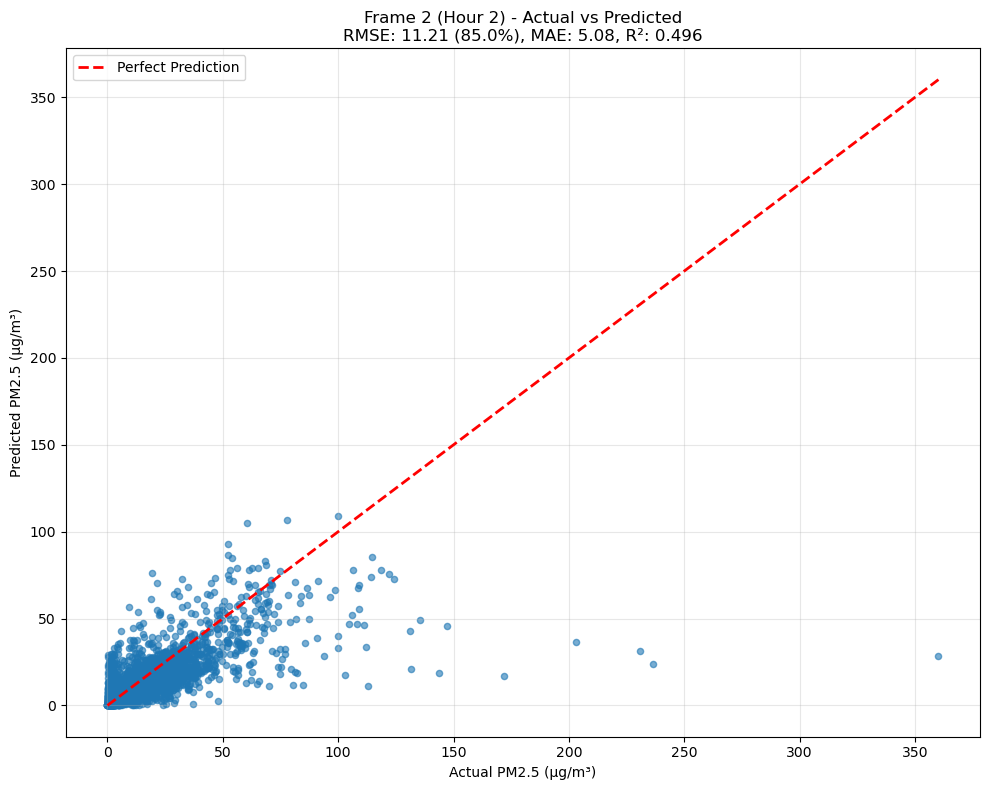


🎯 Hour 3 Scatter Plot


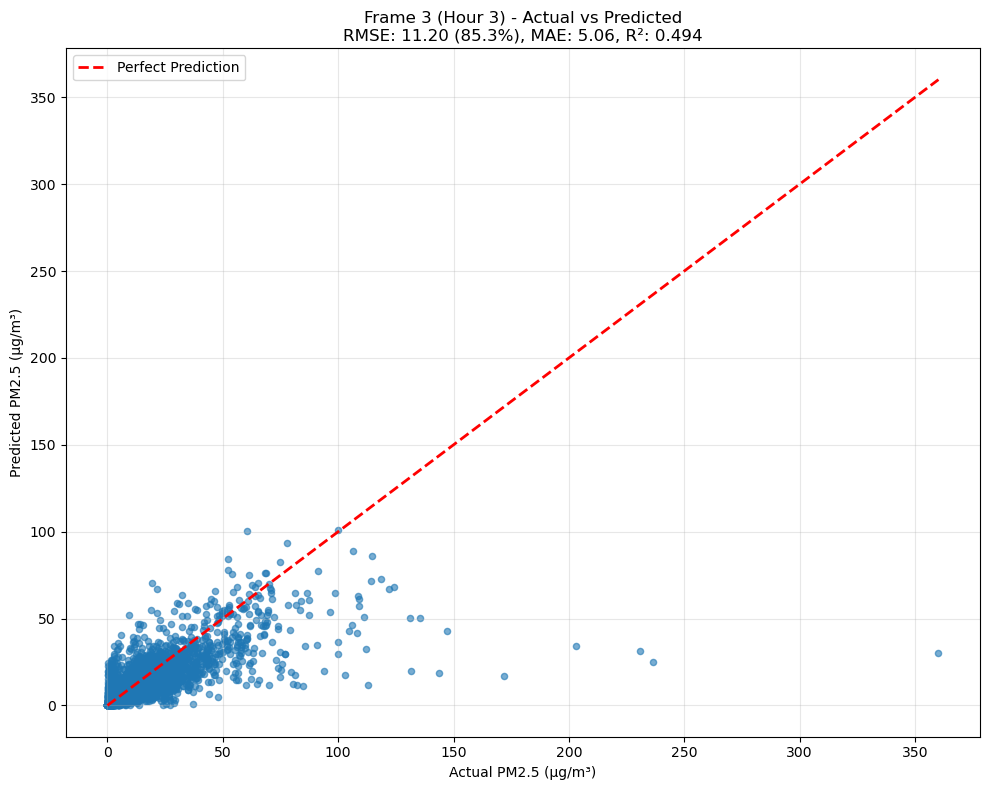


🎯 Hour 4 Scatter Plot


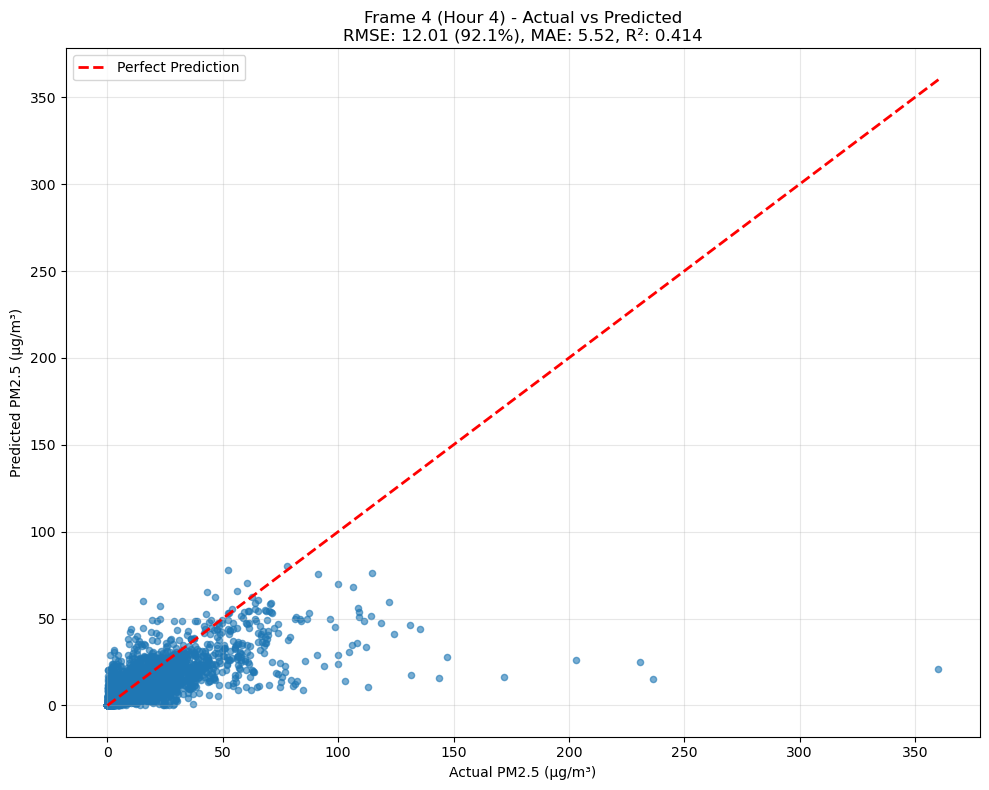


🎯 Hour 5 Scatter Plot


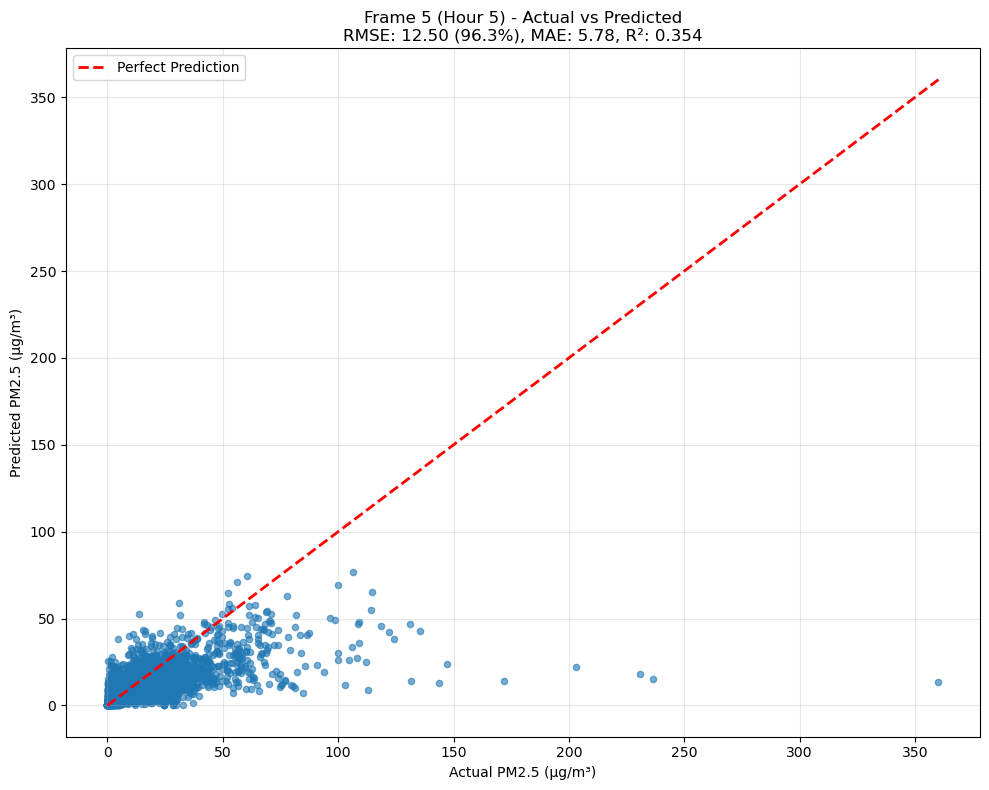

📋 DETAILED CONVLSTM PERFORMANCE BREAKDOWN
This section provides comprehensive metrics for each prediction horizon and monitoring station.
Essential for identifying specific model weaknesses and guiding improvements.

📋 DETAILED FRAME-BY-FRAME STATISTICS

🕐 HOUR 1 ANALYSIS
────────────────────────────────────────────────────────────────────────────────────────────────────
┌─ OVERALL PERFORMANCE ──────────────────────────────────────────────────────────┐
│ RMSE: 11.196 (84.4%)   │   MAE:  5.143   │   R²:  0.499              │
└────────────────────────────────────────────────────────────────────────────────┘

📍 BY SENSOR LOCATION:
────────────────────────────────────────────────────────────────────────────────────────────────────
Location                 │RMSE   │%     │MAE    │R²     │Actual │Pred  
─────────────────────────┼───────┼──────┼───────┼───────┼───────┼──────
Simi Valley - Cochran St │3.69   │63.5  %│2.17   │0.429  │5.8    │4.9   
Reseda                   │9.99   │105.2 %│5.63

In [10]:
import math

Y_test_smoothed = Y_jan_test.copy()
broken_idx = np.transpose(np.where(Y_jan_test == 0))
for sample, frame, station in broken_idx:
    Y_test_smoothed[sample, frame, station] = hrrr_y_pred[sample, frame, station]

total_stations = math.prod(hrrr_y_pred.shape)
print(
    f"Total number of stations: {total_stations}\n"
    f"Number of stations that reported exactly 0 PM2.5, replaced with y_pred: {len(broken_idx)}\n"
    f"Percent of stations replaced: {len(broken_idx)/total_stations*100:.2f}%"
)
              
comprehensive_frame_analysis(hrrr_y_pred, Y_test_smoothed, sensor_names)

Total number of stations: 29400
Number of stations that reported exactly 0 PM2.5, replaced with y_pred: 1715
Percent of stations replaced: 5.83%
🎯 COMPREHENSIVE CONVLSTM PERFORMANCE ANALYSIS
📊 Analyzing 5 frames (hours) across 8 sensors
📈 Dataset: 735 samples

This analysis evaluates ConvLSTM's ability to predict air quality across multiple future time frames
and spatial locations, revealing critical spatio-temporal prediction patterns.

📊 1. FRAME-BY-FRAME RMSE
────────────────────────────────────────────────────────────
📊 TEMPORAL DEGRADATION ANALYSIS
This measures how ConvLSTM prediction accuracy degrades as we predict further into the future.
Later time steps are inherently harder to predict due to error accumulation.



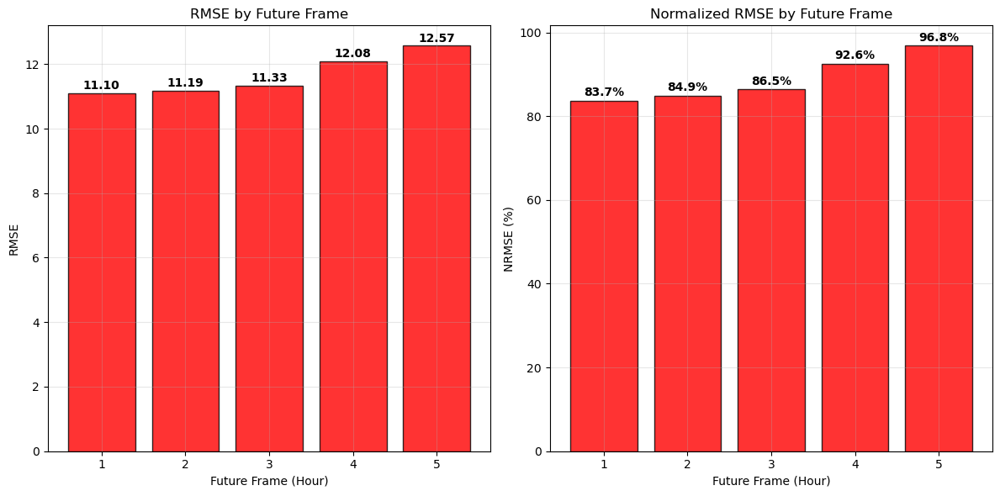


📊 FRAME-BY-FRAME RMSE SUMMARY:
Hour 1: RMSE = 11.103 (83.7%)
Hour 2: RMSE = 11.186 (84.9%)
Hour 3: RMSE = 11.330 (86.5%)
Hour 4: RMSE = 12.081 (92.6%)
Hour 5: RMSE = 12.569 (96.8%)

📍 2. AVERAGE RMSE PER STATION (ALL HOURS)
───────────────────────────────────────────────────────
📍 SPATIAL PERFORMANCE ANALYSIS
This identifies which monitoring stations are consistently difficult for ConvLSTM to predict.
Challenging stations often have complex local meteorology or unique pollution sources.



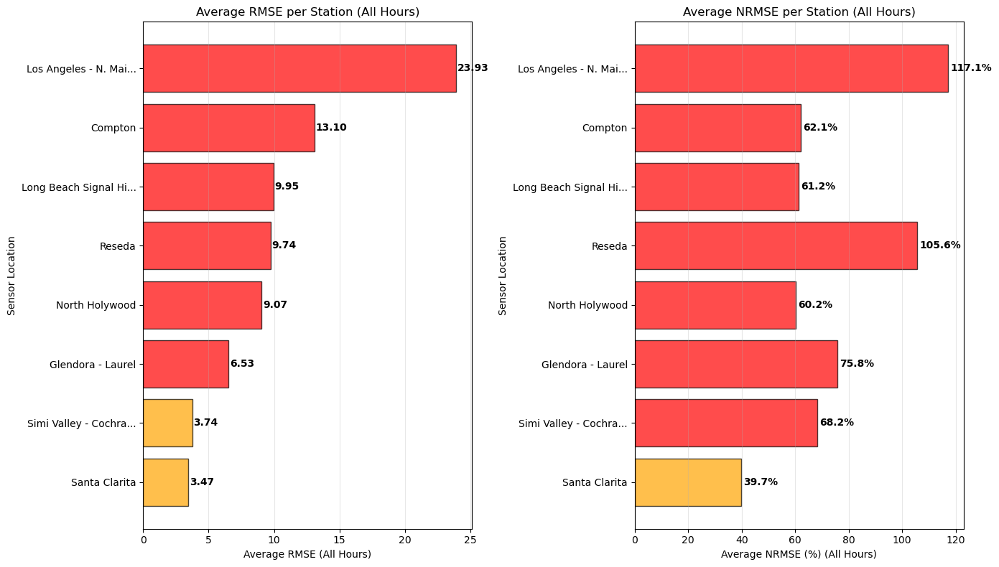


📍 STATION PERFORMANCE SUMMARY (All Hours Combined)

🟢 EXCELLENT Stations (RMSE < 1.5): 0

🟡 GOOD Stations (1.5-3.0): 0

🟠 FAIR Stations (3.0-5.0): 2
   • Santa Clarita: 3.467
   • Simi Valley - Cochran Street: 3.745

🔴 POOR Stations (≥ 5.0): 6
   • Glendora - Laurel: 6.533
   • North Holywood: 9.066
   • Reseda: 9.735
   • Long Beach Signal Hill: 9.949
   • Compton: 13.103
   • Los Angeles - N. Main Street: 23.933

📊 SUMMARY STATISTICS:
   🏆 Best Station:  Santa Clarita (RMSE: 3.467)
   💥 Worst Station: Los Angeles - N. Main Street (RMSE: 23.933)
   📈 Average RMSE:  9.941
   📏 RMSE Range:    20.466
   🎯 Reliability:   0/8 stations ≤ 3.0 RMSE

📊 SUMMARY TABLE - RMSE BY HOUR AND SENSOR
Sensor                   │ Hour 1 │ Hour 2 │ Hour 3 │ Hour 4 │ Hour 5 │  Avg   
─────────────────────────┼────────┼────────┼────────┼────────┼────────┼────────
Simi Valley - Cochran St │  3.89  │  3.70  │  3.61  │  3.72  │  3.80  │  3.74  
Reseda                   │ 10.07  │  9.94  │  9.64  │  9.66  │  9.

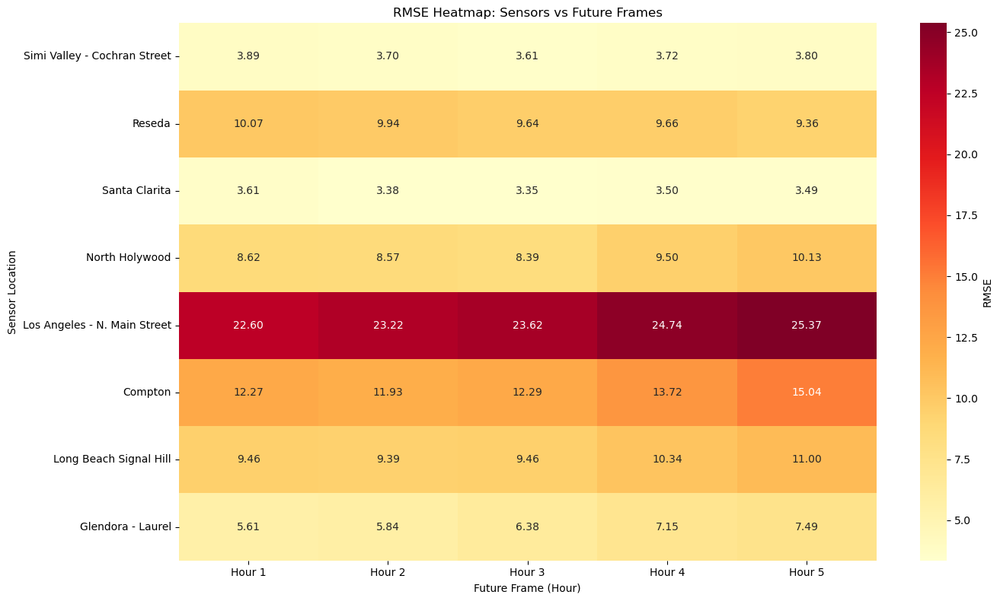


🔥 WORST PERFORMING COMBINATIONS:
Los Angeles - N. Main Street at Hour 5: RMSE = 25.374
Los Angeles - N. Main Street at Hour 4: RMSE = 24.739
Los Angeles - N. Main Street at Hour 3: RMSE = 23.625
Los Angeles - N. Main Street at Hour 2: RMSE = 23.217
Los Angeles - N. Main Street at Hour 1: RMSE = 22.602

📈 4. TIME SERIES BY FRAME
───────────────────────────────────
Temporal pattern analysis

🕐 Hour 1 Time Series


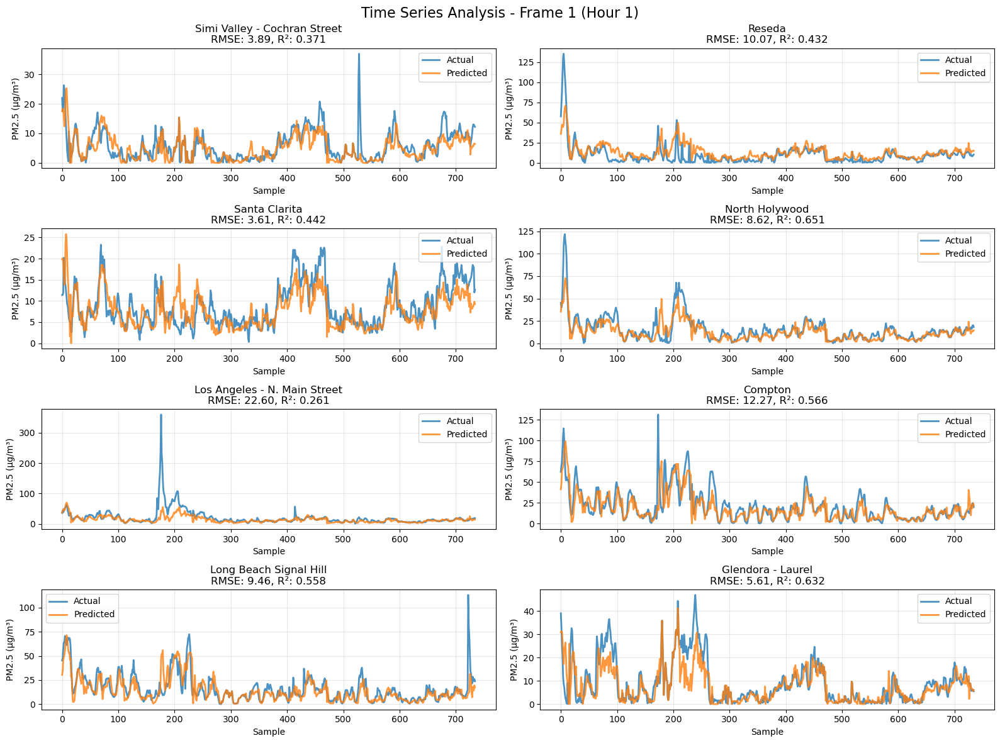


🕐 Hour 2 Time Series


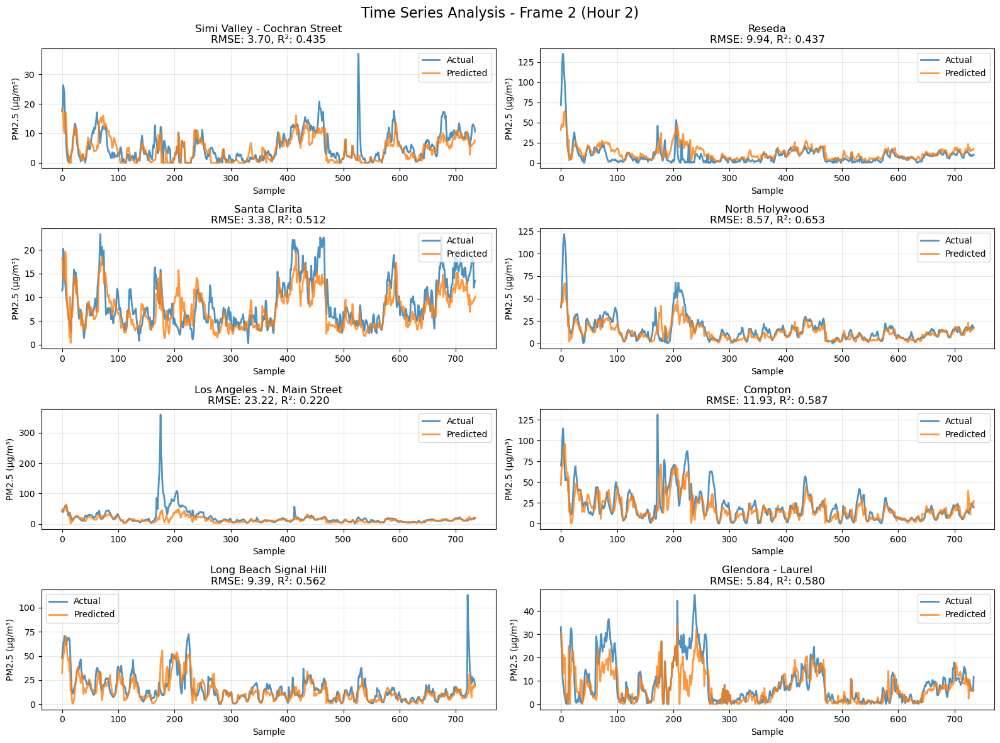


🕐 Hour 3 Time Series


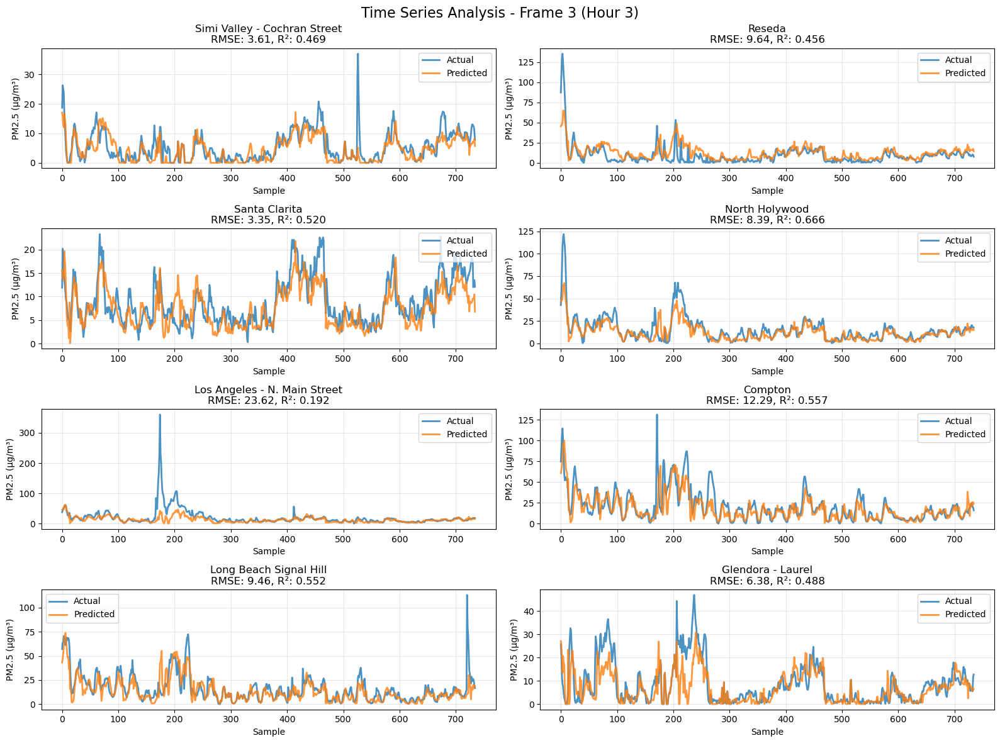


🕐 Hour 4 Time Series


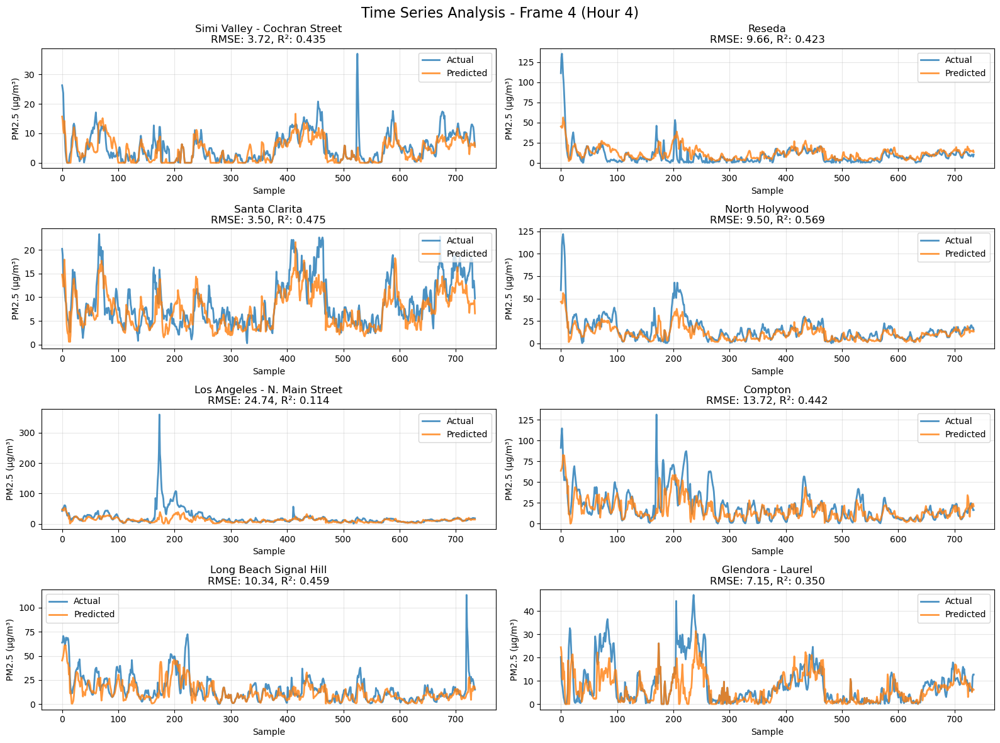


🕐 Hour 5 Time Series


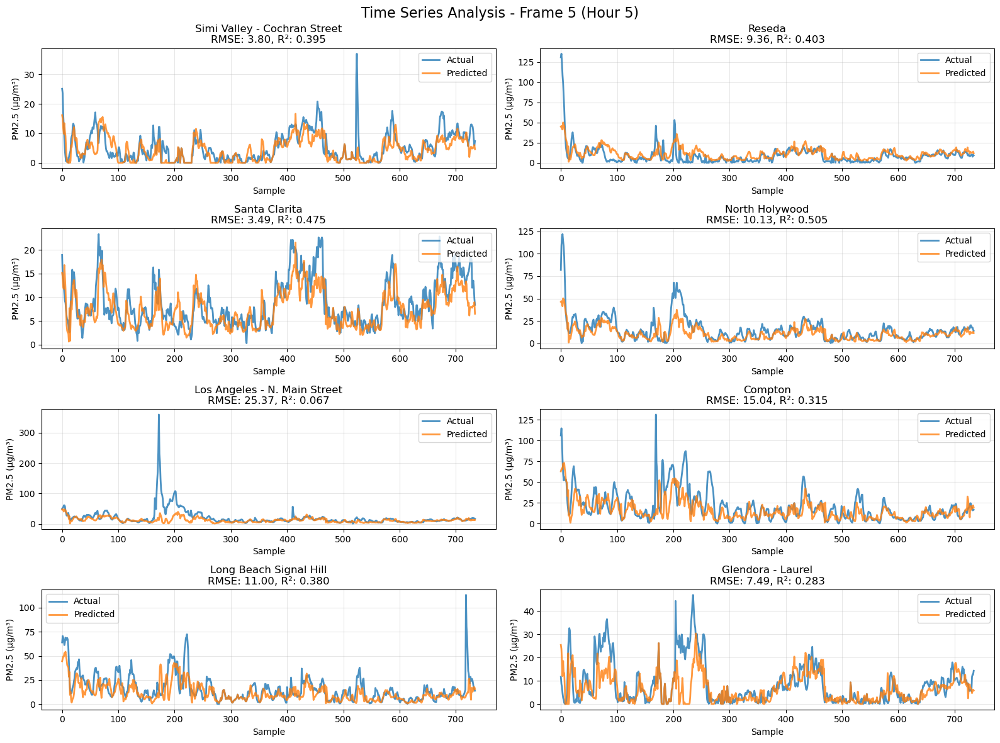


🎯 5. SCATTER PLOTS BY FRAME
───────────────────────────────────
Prediction accuracy assessment for each time frame:

🎯 Hour 1 Scatter Plot


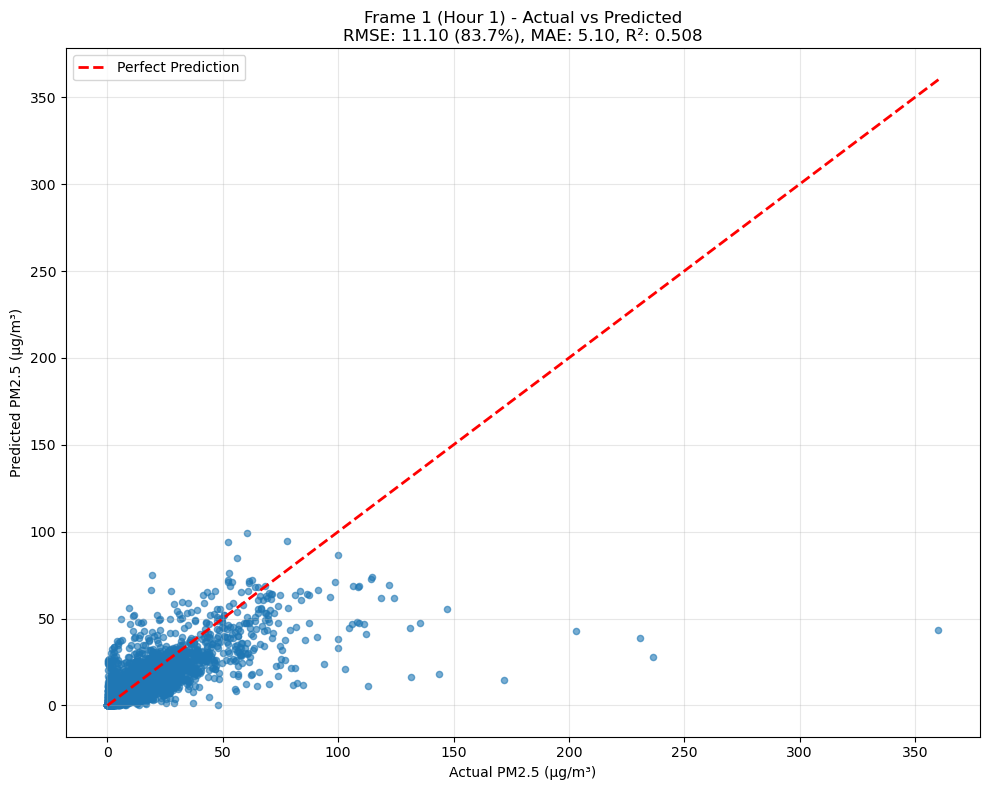


🎯 Hour 2 Scatter Plot


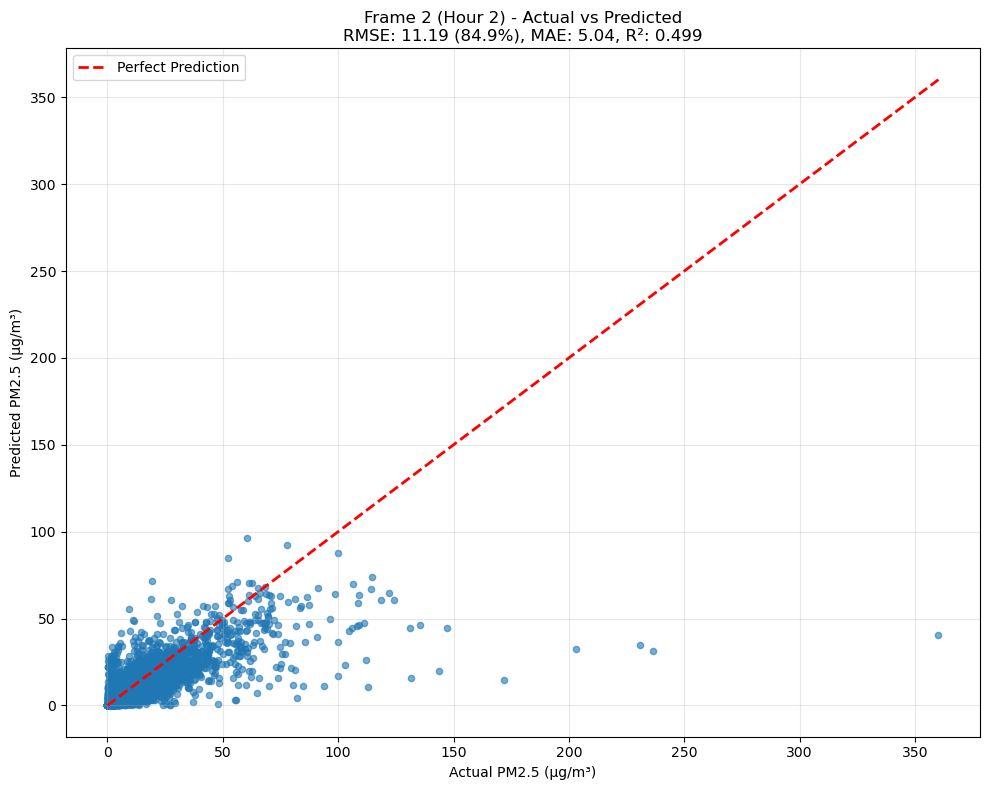


🎯 Hour 3 Scatter Plot


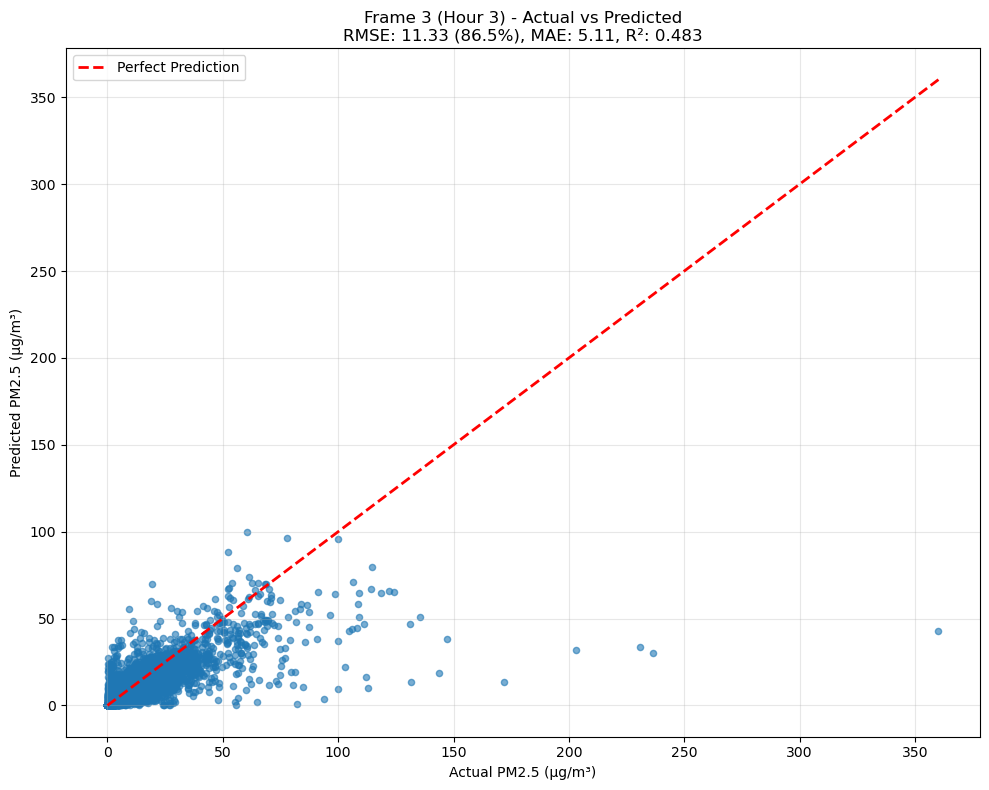


🎯 Hour 4 Scatter Plot


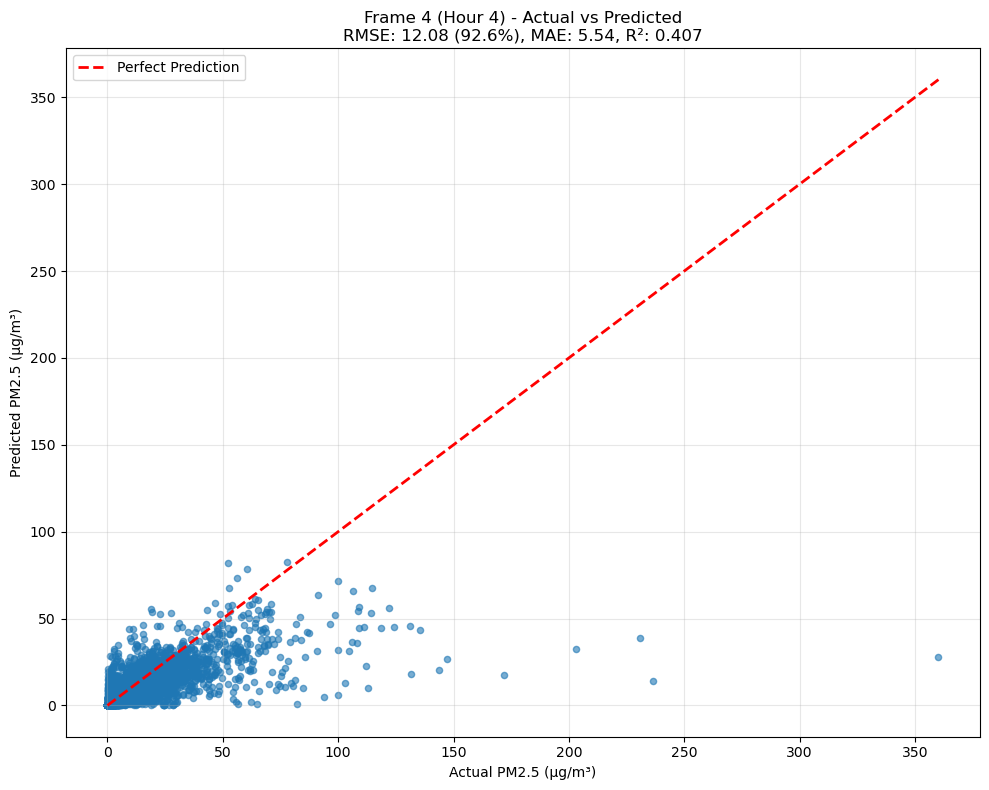


🎯 Hour 5 Scatter Plot


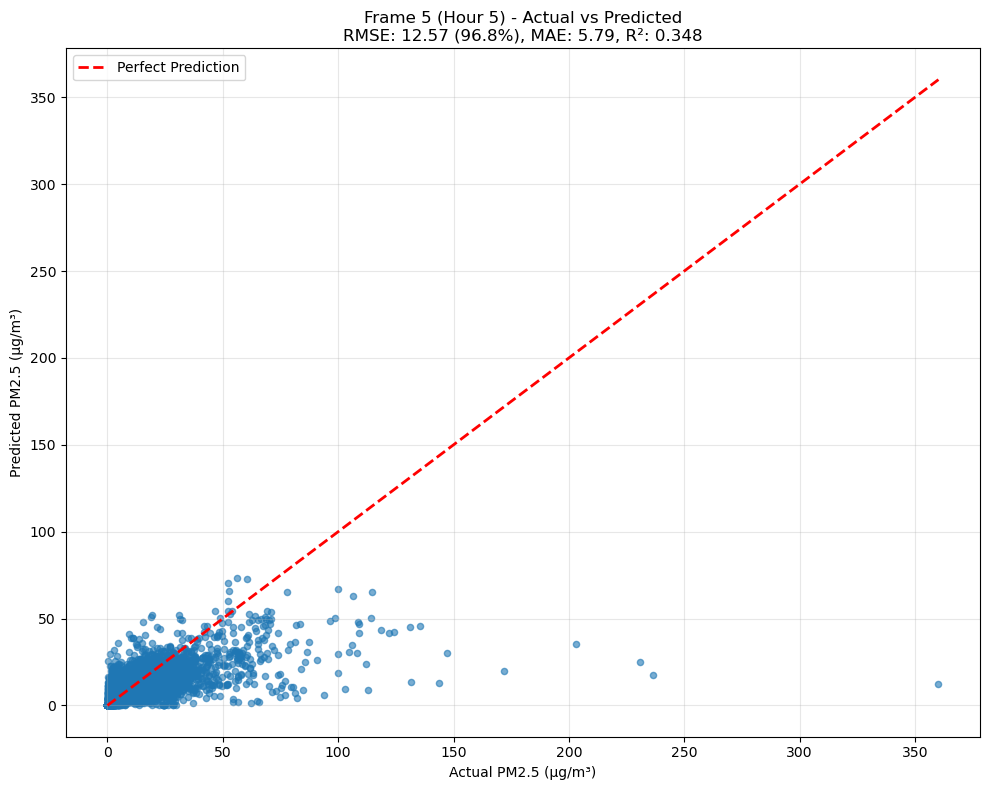

📋 DETAILED CONVLSTM PERFORMANCE BREAKDOWN
This section provides comprehensive metrics for each prediction horizon and monitoring station.
Essential for identifying specific model weaknesses and guiding improvements.

📋 DETAILED FRAME-BY-FRAME STATISTICS

🕐 HOUR 1 ANALYSIS
────────────────────────────────────────────────────────────────────────────────────────────────────
┌─ OVERALL PERFORMANCE ──────────────────────────────────────────────────────────┐
│ RMSE: 11.103 (83.7%)   │   MAE:  5.099   │   R²:  0.508              │
└────────────────────────────────────────────────────────────────────────────────┘

📍 BY SENSOR LOCATION:
────────────────────────────────────────────────────────────────────────────────────────────────────
Location                 │RMSE   │%     │MAE    │R²     │Actual │Pred  
─────────────────────────┼───────┼──────┼───────┼───────┼───────┼──────
Simi Valley - Cochran St │3.89   │68.0  %│2.32   │0.371  │5.7    │4.9   
Reseda                   │10.07  │106.7 %│5.78

In [11]:
import math

Y_test_smoothed = Y_jan_test.copy()
broken_idx = np.transpose(np.where(Y_jan_test == 0))
for sample, frame, station in broken_idx:
    Y_test_smoothed[sample, frame, station] = pwwb_y_pred[sample, frame, station]

total_stations = math.prod(pwwb_y_pred.shape)
print(
    f"Total number of stations: {total_stations}\n"
    f"Number of stations that reported exactly 0 PM2.5, replaced with y_pred: {len(broken_idx)}\n"
    f"Percent of stations replaced: {len(broken_idx)/total_stations*100:.2f}%"
)
              
comprehensive_frame_analysis(pwwb_y_pred, Y_test_smoothed, sensor_names)